# CSE572 Project 2 - Model Training

Mark Khusid

In [194]:
import pandas as pd
import numpy as np

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from scipy.integrate import simpson
from scipy.ndimage import uniform_filter1d
from scipy.signal import find_peaks

from sklearn.impute import KNNImputer

from sklearn.svm import SVC

from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

## Load the datasets

In [2]:
insulin_data_1 = pd.read_csv('InsulinData.csv', low_memory=False)
insulin_data_2 = pd.read_csv('Insulin_patient2.csv', low_memory=False)
cgm_data_1 = pd.read_csv('CGMData.csv', low_memory=False)
cgm_data_2 = pd.read_csv('CGM_patient2.csv', low_memory=False)

## View Dataframes

In [3]:
#insulin_data_1

In [4]:
#cgm_data_1

In [5]:
#insulin_data_2

In [6]:
#cgm_data_2

## EDA on dataframes

In [7]:
#insulin_data_1.info()

In [8]:
#cgm_data_1.info()

In [9]:
#insulin_data_2.info()

In [10]:
#cgm_data_2.info()

## Convert 'Date' and 'Time' columns to datetime format in both datasets for easier manipulation

In [11]:
def preprocess_date(date_string):
    date_string = date_string.strip()
    if len(date_string.split()) == 1:
        return date_string
    elif len(date_string.split()) == 2:
        return date_string.split()[0]

In [12]:
insulin_data_1['Date'] = insulin_data_1['Date'].apply(preprocess_date)
insulin_data_2['Date'] = insulin_data_2['Date'].apply(preprocess_date)

In [13]:
insulin_data_1['datetime'] = pd.to_datetime(insulin_data_1['Date'] + ' ' + insulin_data_1['Time'])
insulin_data_2['datetime'] = pd.to_datetime(insulin_data_2['Date'] + ' ' + insulin_data_2['Time'])

cgm_data_1['datetime'] = pd.to_datetime(cgm_data_1['Date'] + ' ' + cgm_data_1['Time'])
cgm_data_2['datetime'] = pd.to_datetime(cgm_data_2['Date'] + ' ' + cgm_data_2['Time'])

In [14]:
#insulin_data_1[['Date', 'Time', 'datetime']]

In [15]:
#insulin_data_2[['Date', 'Time', 'datetime']]

In [16]:
#cgm_data_1[['Date', 'Time', 'datetime']]

In [17]:
#cgm_data_2[['Date', 'Time', 'datetime']]

## Search for non-zero BWZ Carb Input Data

In [18]:
# This datetime series contains the start of all non NaN and  positive carb input
# data from the column BWZ Carb Input (grams)
meal_times_1 = \
    insulin_data_1[~insulin_data_1['BWZ Carb Input (grams)'].isna() & \
    (insulin_data_1['BWZ Carb Input (grams)'] > 0)]['datetime']
meal_times_1

48      2018-02-12 09:15:45
129     2018-02-12 02:30:55
188     2018-02-11 20:33:18
207     2018-02-11 18:14:37
222     2018-02-11 16:27:04
                ...        
41265   2017-07-26 11:24:52
41274   2017-07-26 09:27:16
41347   2017-07-25 18:31:40
41393   2017-07-25 10:39:46
41401   2017-07-25 10:21:19
Name: datetime, Length: 747, dtype: datetime64[ns]

In [19]:
# This datetime series contains the start of all non NaN and  positive carb input
# data from the column BWZ Carb Input (grams)
meal_times_2 = \
    insulin_data_2[~insulin_data_2['BWZ Carb Input (grams)'].isna() & \
    (insulin_data_2['BWZ Carb Input (grams)'] > 0)]['datetime']
#meal_times_2

## Extract Meal Data

### Obtain CGM Data based on Length of After-Meal Window

In [20]:
# Initialize meal data list
meal_data_1 = []

# Loop through each meal start time
for meal_time in meal_times_1:
    # A meal windows is 2 hours long
    meal_window = insulin_data_1[(insulin_data_1['datetime'] > meal_time) & 
                               (insulin_data_1['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
    #print(meal_window)

    # If that meal window is empty, get corresponding CGM_
    # data that starts at tm-30 and ends at tm+2hrs
    if meal_window.empty:
        # Step 4 condition (a): No meal between tm and tm+2hrs, use this stretch as meal data
        meal_cgm_data_1 = cgm_data_1[(cgm_data_1['datetime'] >= (meal_time - pd.Timedelta(minutes=30))) & 
                                 (cgm_data_1['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
    else:
        # Step 4 check for condition (b) or (c)
        next_meal_time = meal_window.iloc[0]['datetime']
        if next_meal_time < (meal_time + pd.Timedelta(hours=2)):
            # condition (b): There is a meal at tp between tm and tm+2hrs, use tp data
            meal_time = next_meal_time
            meal_cgm_data_1 = cgm_data_1[(cgm_data_1['datetime'] >= (meal_time - pd.Timedelta(minutes=30))) & 
                                     (cgm_data_1['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
        # Condition (c): There is a meal exactly at tm+2hrs, use tm+1hr 30min to tm+4hrs
        elif next_meal_time == (meal_time + pd.Timedelta(hours=2)):
            meal_cgm_data_1 = cgm_data_1[(cgm_data_1['datetime'] >= (meal_time + pd.Timedelta(hours=1, minutes=30))) & 
                                     (cgm_data_1['datetime'] <= (meal_time + pd.Timedelta(hours=4)))]

    # Check if the extracted data has the correct number of points (30 for meal data)
    if len(meal_cgm_data_1) == 30:
        #print(f"Meal Time Data {meal_time} has {len(meal_cgm_data)} number of points.")
        meal_data_1.append(meal_cgm_data_1['Sensor Glucose (mg/dL)'].values)

In [21]:
# Initialize meal data list
meal_data_2 = []

# Loop through each meal start time
for meal_time in meal_times_2:
    # A meal windows is 2 hours long
    meal_window = insulin_data_2[(insulin_data_2['datetime'] > meal_time) & 
                               (insulin_data_2['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
    #print(meal_window)

    # If that meal window is empty, get corresponding CGM_
    # data that starts at tm-30 and ends at tm+2hrs
    if meal_window.empty:
        # Step 4 condition (a): No meal between tm and tm+2hrs, use this stretch as meal data
        meal_cgm_data_2 = cgm_data_2[(cgm_data_2['datetime'] >= (meal_time - pd.Timedelta(minutes=30))) & 
                                 (cgm_data_2['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
    else:
        # Step 4 check for condition (b) or (c)
        next_meal_time = meal_window.iloc[0]['datetime']
        if next_meal_time < (meal_time + pd.Timedelta(hours=2)):
            # condition (b): There is a meal at tp between tm and tm+2hrs, use tp data
            meal_time = next_meal_time
            meal_cgm_data_2 = cgm_data_2[(cgm_data_2['datetime'] >= (meal_time - pd.Timedelta(minutes=30))) & 
                                     (cgm_data_2['datetime'] <= (meal_time + pd.Timedelta(hours=2)))]
        # Condition (c): There is a meal exactly at tm+2hrs, use tm+1hr 30min to tm+4hrs
        elif next_meal_time == (meal_time + pd.Timedelta(hours=2)):
            meal_cgm_data_2 = cgm_data_2[(cgm_data_2['datetime'] >= (meal_time + pd.Timedelta(hours=1, minutes=30))) & 
                                     (cgm_data_2['datetime'] <= (meal_time + pd.Timedelta(hours=4)))]

    # Check if the extracted data has the correct number of points (30 for meal data)
    if len(meal_cgm_data_2) == 30:
        #print(f"Meal Time Data {meal_time} has {len(meal_cgm_data)} number of points.")
        meal_data_2.append(meal_cgm_data_2['Sensor Glucose (mg/dL)'].values)

### Get Length of Meal Data CGM Values

In [22]:
len(meal_data_1)

715

In [23]:
len(meal_data_2)

372

In [24]:
meal_data_1[0:5]

[array([ nan,  nan, 124., 126., 127., 128., 130., 137., 140.,  nan, 150.,
        140., 131., 130., 134., 148.,  nan, 159., 157., 140., 146., 148.,
        151., 150., 162., 174., 180., 178., 184., 185.]),
 array([121., 120., 115., 110., 106., 103., 103., 101.,  nan, 131., 109.,
         82.,  74.,  66.,  73.,  82.,  87.,  90.,  83.,  73.,  49.,  58.,
         69.,  79.,  nan,  93.,  92.,  86.,  84.,  80.]),
 array([287., 288., 289., 279., 260., 262., 259., 250., 245., 250., 247.,
        243., 227., 213., 205., 182., 175., 170., 166., 164., 165., 158.,
        153., 161., 177., 194., 200., 201., 189., 162.]),
 array([189., 162., 166., 173., 176., 169., 167., 166., 168., 180., 182.,
        178., 171., 160., 145., 138., 132., 120., 127., 129., 132., 123.,
        104., 100., 107., 106., 123., 128., 137., 147.]),
 array([107., 106., 123., 128., 137., 147., 145., 142.,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  n

In [25]:
#meal_data_2[0:5]

### Create Meal Data Matrix

In [26]:
meal_data_matrix_1 = np.array(meal_data_1)
meal_data_matrix_1

array([[ nan,  nan, 124., ..., 178., 184., 185.],
       [121., 120., 115., ...,  86.,  84.,  80.],
       [287., 288., 289., ..., 201., 189., 162.],
       ...,
       [274., 278., 283., ..., 268., 281., 292.],
       [223., 222., 222., ..., 324., 326., 328.],
       [ 82.,  85.,  92., ..., 164., 163., 155.]])

In [27]:
meal_data_matrix_1.shape

(715, 30)

In [28]:
meal_data_matrix_2 = np.array(meal_data_2)
meal_data_matrix_2

array([[390., 391., 389., ..., 165., 139., 133.],
       [116., 113., 110., ..., 248., 233., 222.],
       [130., 129., 126., ..., 153., 147., 147.],
       ...,
       [174., 181., 191., ..., 126., 129., 128.],
       [174., 181., 191., ..., 126., 129., 128.],
       [102.,  94.,  92., ..., 169., 180., 186.]])

In [29]:
meal_data_matrix_2.shape

(372, 30)

### Visualize Meal Data Matrix 1

#### Heatmap of Meal Data Matrix 1

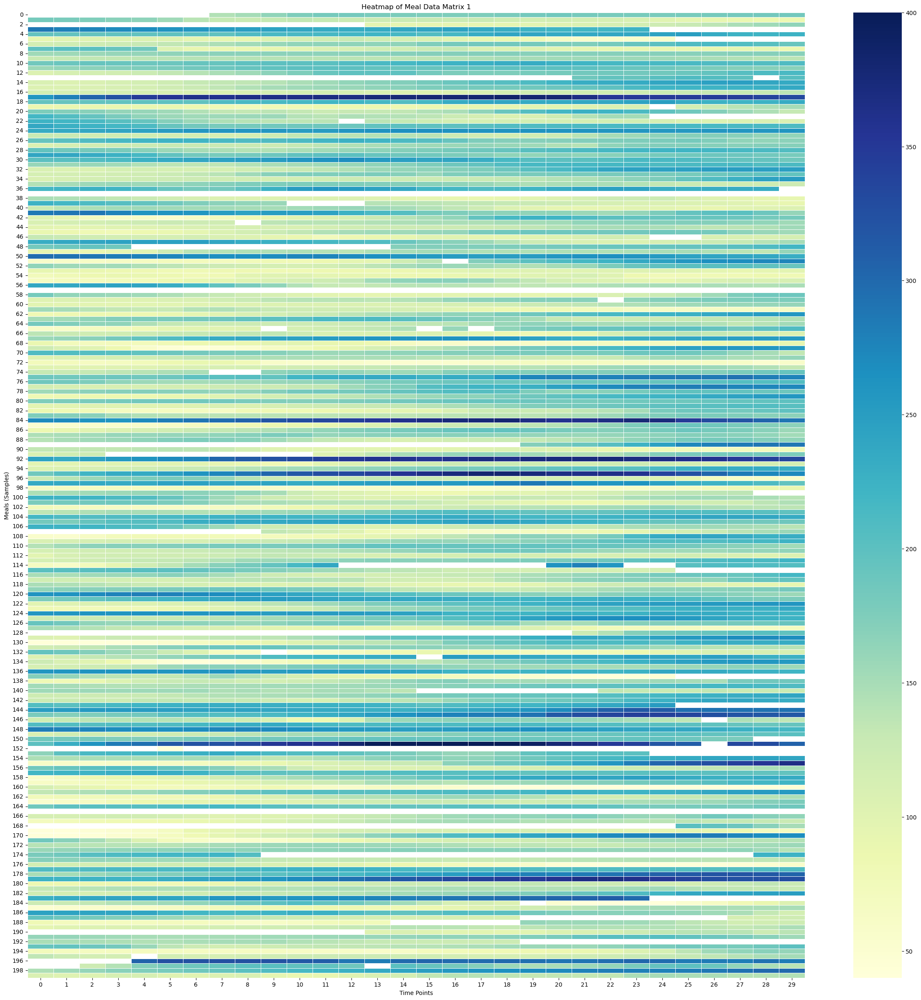

In [30]:
# Create the heatmap
sampled_meal_data_matrix_1 = meal_data_matrix_1[np.random.choice(meal_data_matrix_1.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_meal_data_matrix_1, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of Meal Data Matrix 1')
plt.xlabel('Time Points')
plt.ylabel('Meals (Samples)')
plt.show()

#### Surface Plot of Meal Data Matrix 1

In [31]:
# Create X, Y meshgrid
X = np.arange(meal_data_matrix_1.shape[1])
Y = np.arange(meal_data_matrix_1.shape[0])
time_points = np.linspace(-30, 120, 30)  # X-axis: from -30 minutes to +120 minutes (30 time points)
meal_numbers = np.arange(1, len(meal_data_1) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [32]:
X

array([[-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       ...,
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ]])

In [33]:
X.shape

(715, 30)

In [34]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [712, 712, 712, ..., 712, 712, 712],
       [713, 713, 713, ..., 713, 713, 713],
       [714, 714, 714, ..., 714, 714, 714]])

In [35]:
# Fill NaNs using forward fill, then backward fill
meal_data_matrix_1_df = pd.DataFrame(meal_data_matrix_1)
meal_data_matrix_1_filled = meal_data_matrix_1_df.ffill().bfill().values

In [36]:
# Apply a moving average smoothing to each row
window_size = 5  # Choose a window size for smoothing
smoothed_meal_data_matrix_1 = np.array([uniform_filter1d(row, size=window_size) for row in meal_data_matrix_1_filled])

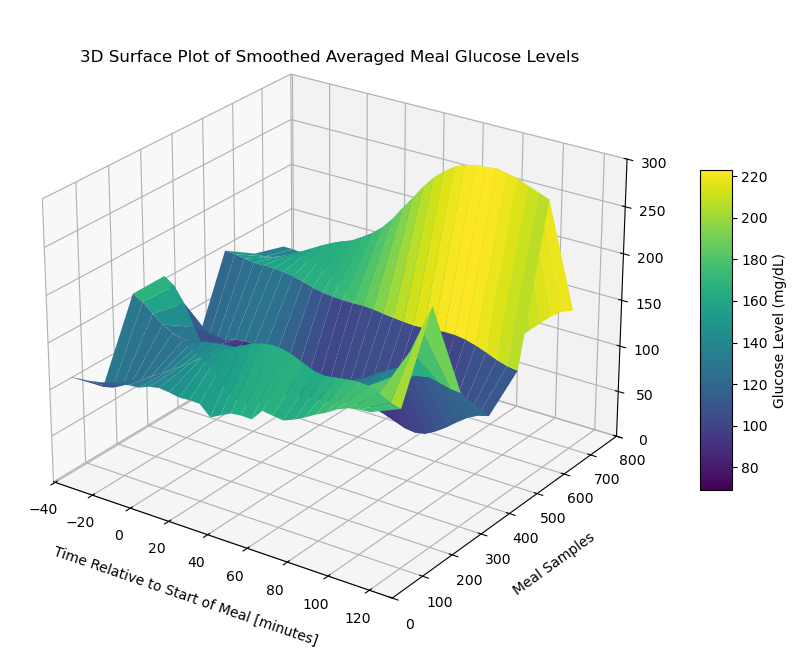

In [37]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_meal_data_matrix_1[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to Start of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
ax.set_ylim(0, 800)
ax.set_zlim(0, 300)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of Meal Data Matrix 1

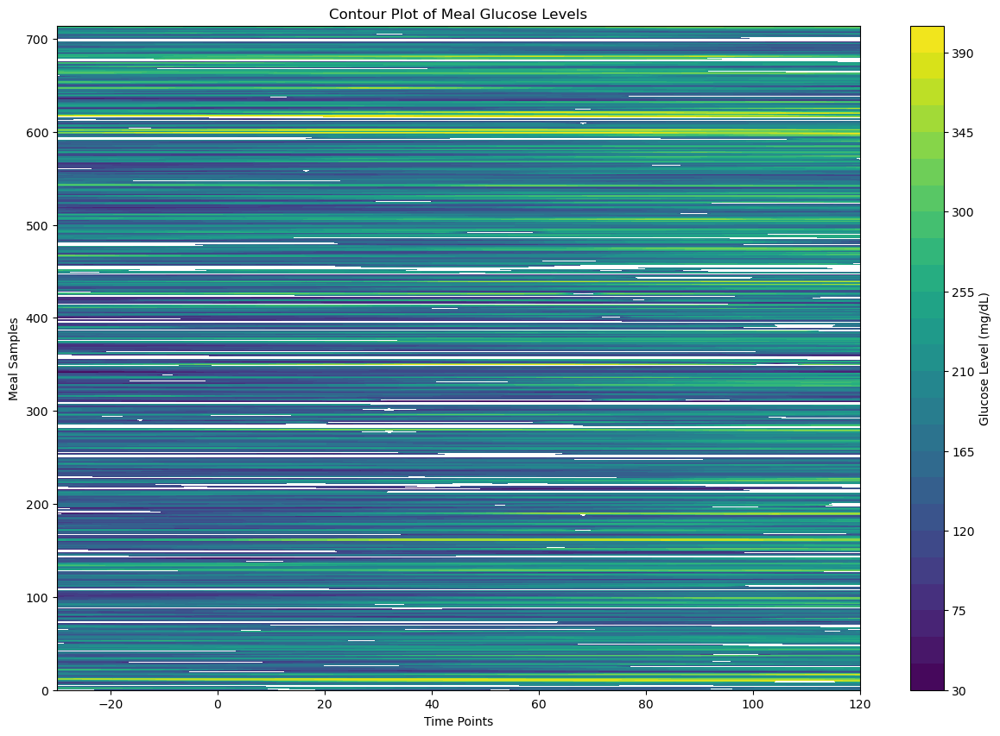

In [38]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, meal_data_matrix_1_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

### Visualize Meal Data Matrix 2

#### Heatmap of Meal Data Matrix 2

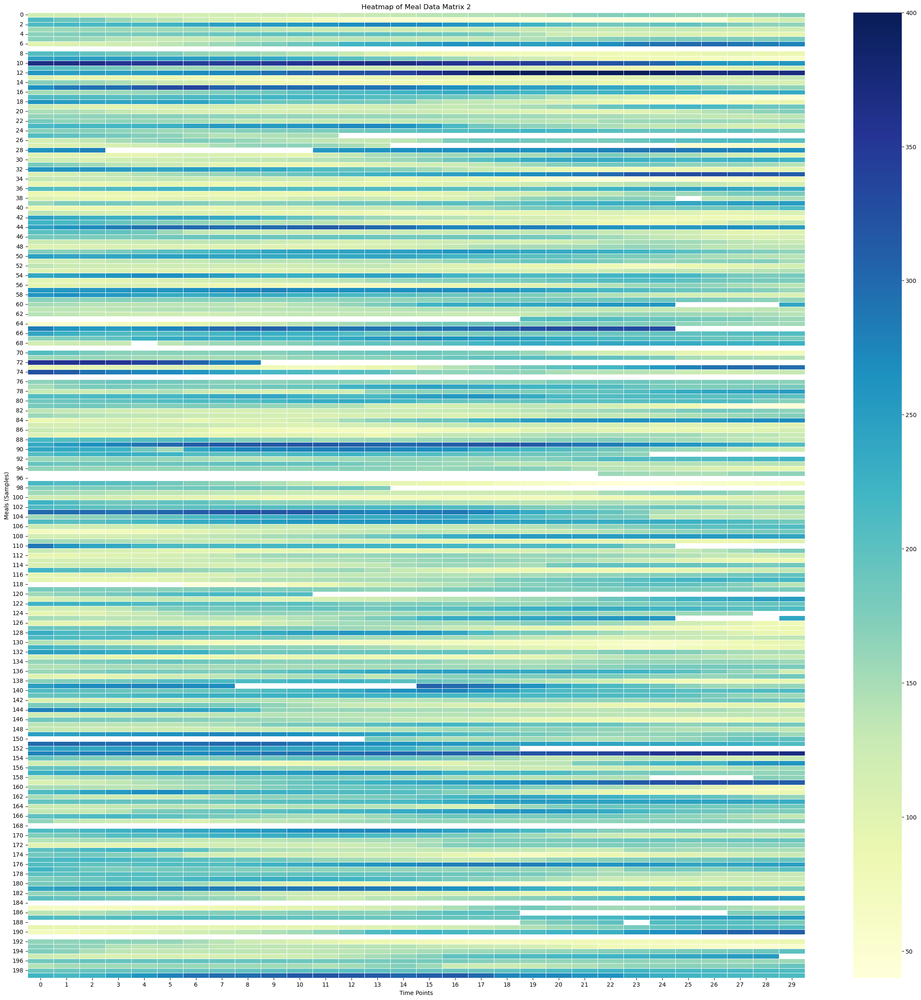

In [39]:
# Create the heatmap
sampled_meal_data_matrix_2 = meal_data_matrix_2[np.random.choice(meal_data_matrix_2.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_meal_data_matrix_2, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of Meal Data Matrix 2')
plt.xlabel('Time Points')
plt.ylabel('Meals (Samples)')
plt.show()

#### Surface Plot of Meal Data Matrix 2

In [40]:
# Create X, Y meshgrid
X = np.arange(meal_data_matrix_2.shape[1])
Y = np.arange(meal_data_matrix_2.shape[0])
time_points = np.linspace(-30, 120, 30)  # X-axis: from -30 minutes to +120 minutes (30 time points)
meal_numbers = np.arange(1, len(meal_data_2) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [41]:
X

array([[-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       ...,
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ]])

In [42]:
X.shape

(372, 30)

In [43]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [369, 369, 369, ..., 369, 369, 369],
       [370, 370, 370, ..., 370, 370, 370],
       [371, 371, 371, ..., 371, 371, 371]])

In [44]:
# Fill NaNs using forward fill, then backward fill
meal_data_matrix_2_df = pd.DataFrame(meal_data_matrix_2)
meal_data_matrix_2_filled = meal_data_matrix_2_df.ffill().bfill().values

In [45]:
# Apply a moving average smoothing to each row
window_size = 5  # Choose a window size for smoothing
smoothed_meal_data_matrix_2 = np.array([uniform_filter1d(row, size=window_size) for row in meal_data_matrix_2_filled])

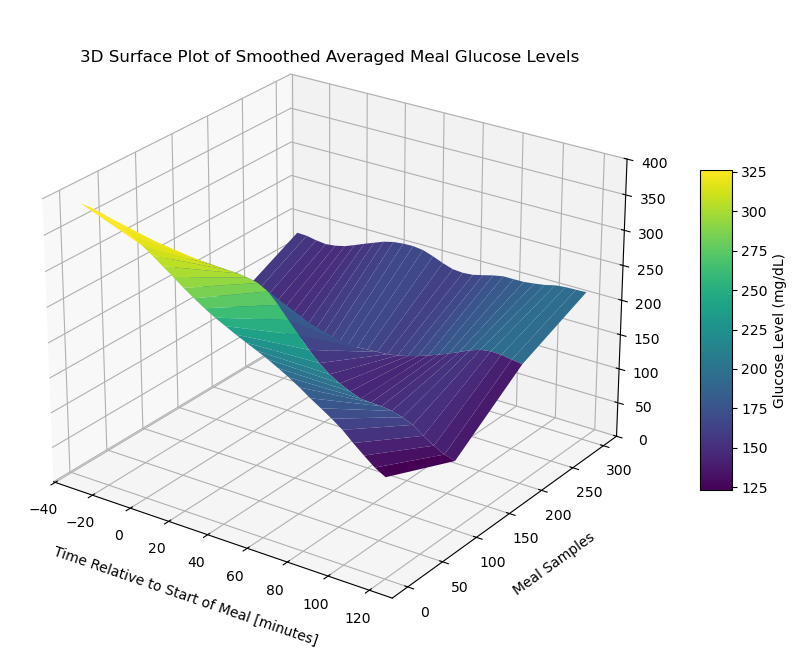

In [46]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_meal_data_matrix_2[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to Start of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)
ax.set_zlim(0, 400)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of Meal Data Matrix 2

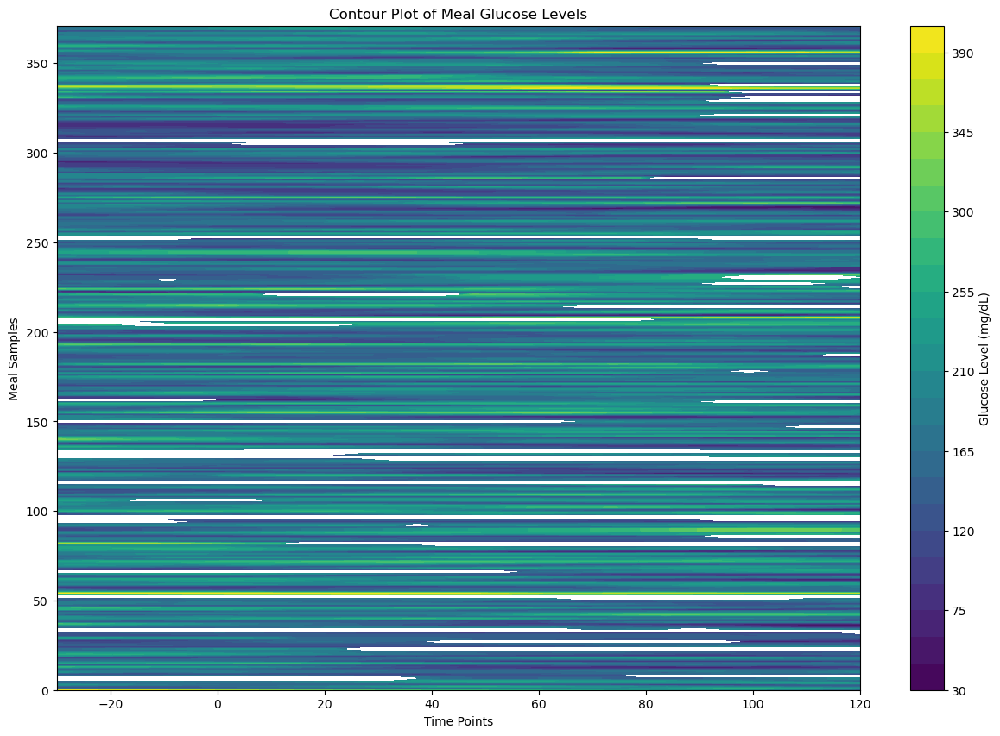

In [47]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, meal_data_matrix_2_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

## Extract No - Meal Data

In [48]:
# Initialize meal data list
no_meal_data_1 = []
    
# Loop through each meal start time to find valid post - absorbtive windows
for meal_time in meal_times_1:
    # Define the post-absorptive period: starts from tm+2 hours
    # and lasts 2 hours (i.e to four hours)
    post_absorptive_start = meal_time + pd.Timedelta(hours=2)
    post_absorptive_end = meal_time + pd.Timedelta(hours=4)
    
    # Check for meals in the post-absorptive period
    post_absorptive_meals = insulin_data_1[(insulin_data_1['datetime'] >= post_absorptive_start) &
                                         (insulin_data_1['datetime'] <= post_absorptive_end)]
    
    # Step 2 Condition (a): If any non-zero, non-NaN meal is found in the
    # post-absorptive period, skip this stretch
    if not post_absorptive_meals.empty:
        # Check if any of the meals have a non-zero carb input
        if (post_absorptive_meals['BWZ Carb Input (grams)'] > 0).any():
            # Skip this stretch, as there is a meal found in the post-absorptive period
            continue
    
    # Step 2 condition (b): If meal values are 0 or NaN, ignore and consider the stretch
    # Extract the corresponding 2-hour CGM data
    no_meal_cgm_data_1 = cgm_data_1[(cgm_data_1['datetime'] >= post_absorptive_start) & 
                                (cgm_data_1['datetime'] <= post_absorptive_end)]
    
    # Check if the extracted data has the correct number of points (24 for no meal data)
    if len(no_meal_cgm_data_1) == 24:
        no_meal_data_1.append(no_meal_cgm_data_1['Sensor Glucose (mg/dL)'].values)

In [49]:
# Initialize meal data list
no_meal_data_2 = []
    
# Loop through each meal start time to find valid post - absorbtive windows
for meal_time in meal_times_2:
    # Define the post-absorptive period: starts from tm+2 hours
    # and lasts 2 hours (i.e to four hours)
    post_absorptive_start = meal_time + pd.Timedelta(hours=2)
    post_absorptive_end = meal_time + pd.Timedelta(hours=4)
    
    # Check for meals in the post-absorptive period
    post_absorptive_meals = insulin_data_2[(insulin_data_2['datetime'] >= post_absorptive_start) &
                                         (insulin_data_2['datetime'] <= post_absorptive_end)]
    
    # Step 2 Condition (a): If any non-zero, non-NaN meal is found in the
    # post-absorptive period, skip this stretch
    if not post_absorptive_meals.empty:
        # Check if any of the meals have a non-zero carb input
        if (post_absorptive_meals['BWZ Carb Input (grams)'] > 0).any():
            # Skip this stretch, as there is a meal found in the post-absorptive period
            continue
    
    # Step 2 condition (b): If meal values are 0 or NaN, ignore and consider the stretch
    # Extract the corresponding 2-hour CGM data
    no_meal_cgm_data_2 = cgm_data_2[(cgm_data_2['datetime'] >= post_absorptive_start) & 
                                (cgm_data_2['datetime'] <= post_absorptive_end)]
    
    # Check if the extracted data has the correct number of points (24 for no meal data)
    if len(no_meal_cgm_data_2) == 24:
        no_meal_data_2.append(no_meal_cgm_data_2['Sensor Glucose (mg/dL)'].values)

In [50]:
len(no_meal_data_1)

510

In [51]:
len(no_meal_data_2)

325

In [52]:
#no_meal_data_1[0:5]

In [53]:
#no_meal_data_2[0:5]

### Create No Meal Data Matrix

In [54]:
no_meal_data_matrix_1 = np.array(no_meal_data_1)
#no_meal_data_matrix_1

In [55]:
no_meal_data_matrix_2 = np.array(no_meal_data_2)
#no_meal_data_matrix_2

In [56]:
no_meal_data_matrix_1.shape

(510, 24)

In [57]:
no_meal_data_matrix_2.shape

(325, 24)

### Visualize No Meal Data Matrix 1

#### Heatmap of No Meal Data Matrix 1

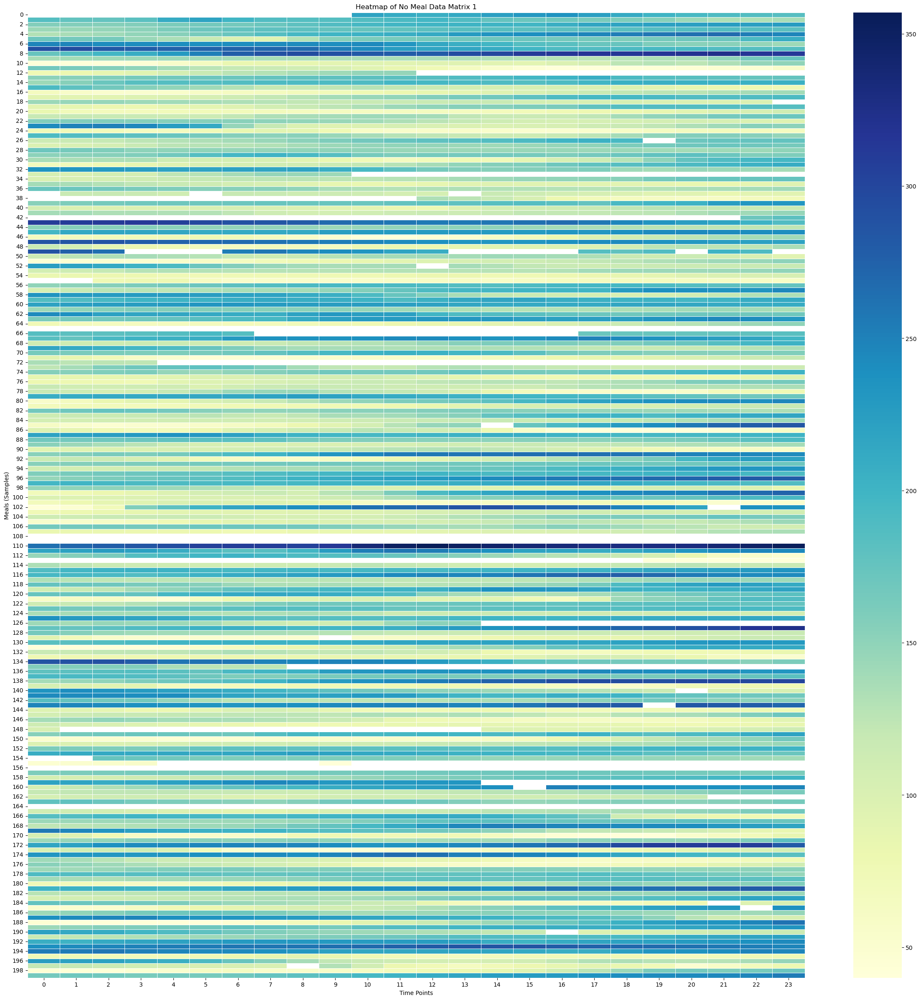

In [58]:
# Create the heatmap
sampled_no_meal_data_matrix_1 = no_meal_data_matrix_1[np.random.choice(no_meal_data_matrix_1.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_no_meal_data_matrix_1, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of No Meal Data Matrix 1')
plt.xlabel('Time Points')
plt.ylabel('Meals (Samples)')
plt.show()

#### Surface Plot of No Meal Data Matrix 1

In [59]:
time_points = np.linspace(-30, 120, 24)
print(time_points)
print(time_points.shape)

[-30.         -23.47826087 -16.95652174 -10.43478261  -3.91304348
   2.60869565   9.13043478  15.65217391  22.17391304  28.69565217
  35.2173913   41.73913043  48.26086957  54.7826087   61.30434783
  67.82608696  74.34782609  80.86956522  87.39130435  93.91304348
 100.43478261 106.95652174 113.47826087 120.        ]
(24,)


In [60]:
# Create X, Y meshgrid
X = np.arange(no_meal_data_matrix_1.shape[1])
Y = np.arange(no_meal_data_matrix_1.shape[0])
time_points = np.linspace(-30, 120, 24)  # X-axis: from -30 minutes to +120 minutes (24 time points)
meal_numbers = np.arange(1, len(no_meal_data_1) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [61]:
X

array([[-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       ...,
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ]])

In [62]:
X.shape

(510, 24)

In [63]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [507, 507, 507, ..., 507, 507, 507],
       [508, 508, 508, ..., 508, 508, 508],
       [509, 509, 509, ..., 509, 509, 509]])

In [64]:
Y.shape

(510, 24)

In [65]:
# Fill NaNs using forward fill, then backward fill
no_meal_data_matrix_1_df = pd.DataFrame(no_meal_data_matrix_1)
no_meal_data_matrix_1_filled = no_meal_data_matrix_1_df.ffill().bfill().values

In [66]:
# Apply a moving average smoothing to each row
window_size = 5  # Choose a window size for smoothing
smoothed_no_meal_data_matrix_1 = np.array([uniform_filter1d(row, size=window_size) for row in no_meal_data_matrix_1_filled])

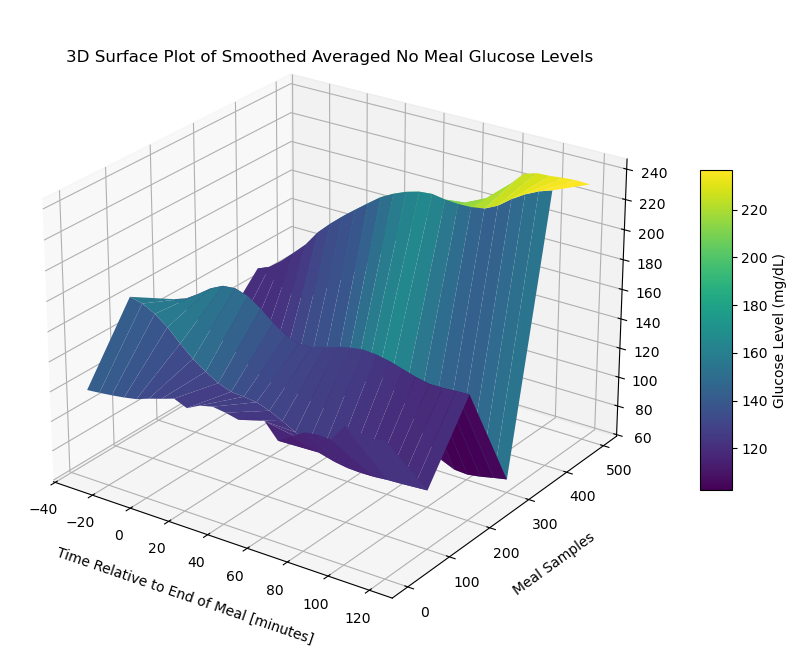

In [67]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_no_meal_data_matrix_1[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged No Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to End of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)
#ax.set_zlim(0, 300)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of No Meal Data Matrix 1

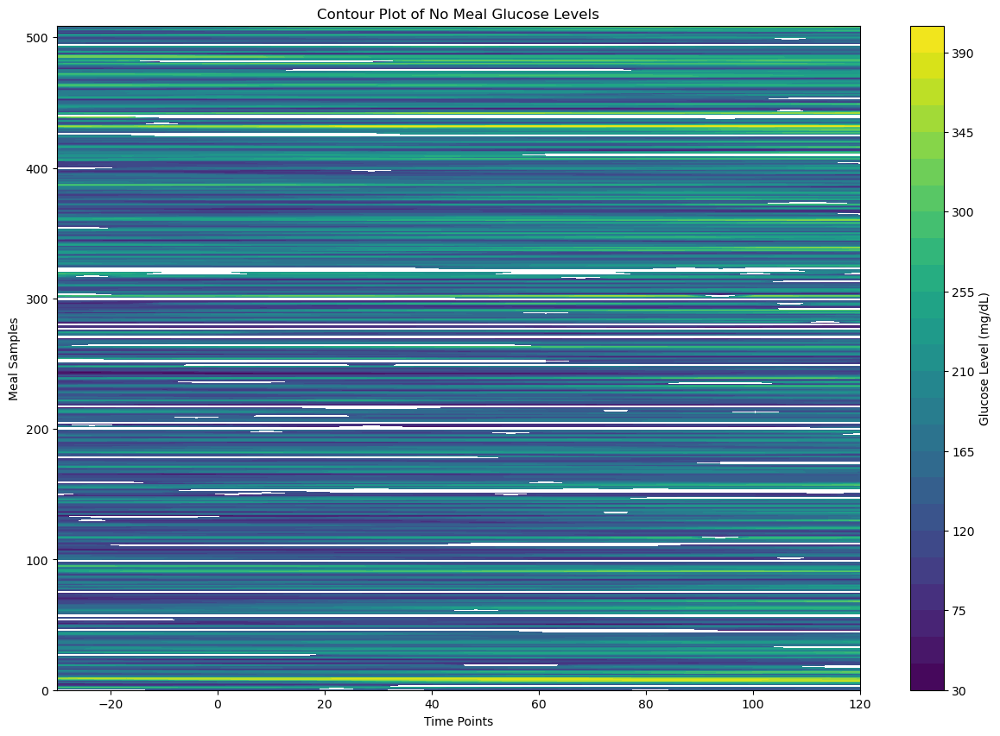

In [68]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, no_meal_data_matrix_1_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of No Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

### Visualize No Meal Data Matrix 2

#### Heatmap of No Meal Data Matrix 2

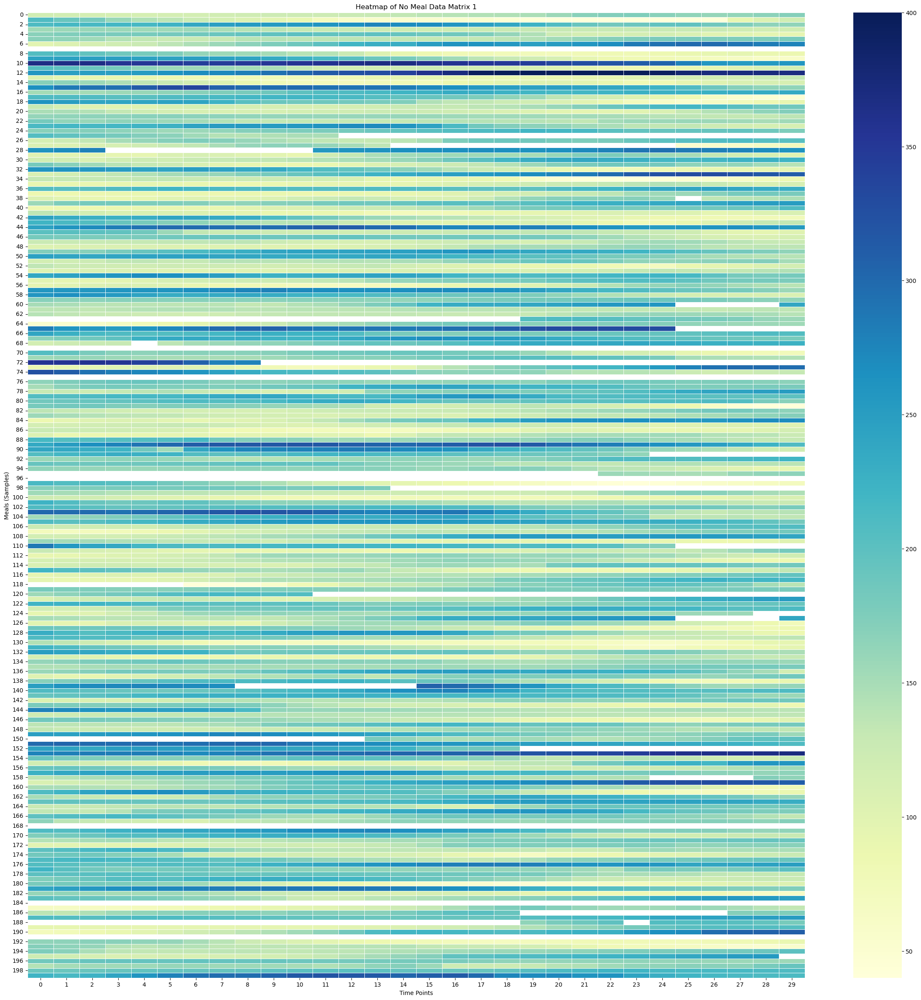

In [69]:
# Create the heatmap
sampled_no_meal_data_matrix_2 = no_meal_data_matrix_2[np.random.choice(no_meal_data_matrix_2.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_meal_data_matrix_2, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of No Meal Data Matrix 1')
plt.xlabel('Time Points')
plt.ylabel('Meals (Samples)')
plt.show()

#### Surface Plot of No Meal Data Matrix 2

In [70]:
time_points = np.linspace(-30, 120, 24)
print(time_points)
print(time_points.shape)

[-30.         -23.47826087 -16.95652174 -10.43478261  -3.91304348
   2.60869565   9.13043478  15.65217391  22.17391304  28.69565217
  35.2173913   41.73913043  48.26086957  54.7826087   61.30434783
  67.82608696  74.34782609  80.86956522  87.39130435  93.91304348
 100.43478261 106.95652174 113.47826087 120.        ]
(24,)


In [71]:
# Create X, Y meshgrid
X = np.arange(no_meal_data_matrix_2.shape[1])
Y = np.arange(no_meal_data_matrix_2.shape[0])
time_points = np.linspace(-30, 120, 24)  # X-axis: from -30 minutes to +120 minutes (24 time points)
meal_numbers = np.arange(1, len(no_meal_data_2) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [72]:
X

array([[-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       ...,
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ],
       [-30.        , -23.47826087, -16.95652174, ..., 106.95652174,
        113.47826087, 120.        ]])

In [73]:
X.shape

(325, 24)

In [74]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [322, 322, 322, ..., 322, 322, 322],
       [323, 323, 323, ..., 323, 323, 323],
       [324, 324, 324, ..., 324, 324, 324]])

In [75]:
Y.shape

(325, 24)

In [76]:
# Fill NaNs using forward fill, then backward fill
no_meal_data_matrix_2_df = pd.DataFrame(no_meal_data_matrix_2)
no_meal_data_matrix_2_filled = no_meal_data_matrix_2_df.ffill().bfill().values

In [77]:
# Apply a moving average smoothing to each row
window_size = 5  # Choose a window size for smoothing
smoothed_no_meal_data_matrix_2 = np.array([uniform_filter1d(row, size=window_size) for row in no_meal_data_matrix_2_filled])

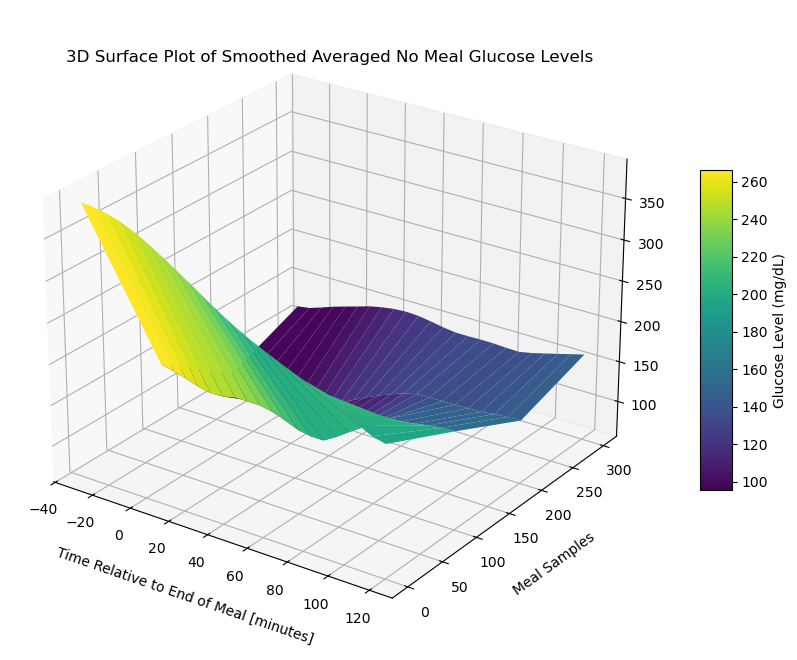

In [78]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_no_meal_data_matrix_2[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged No Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to End of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)
#ax.set_zlim(0, 300)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of No Meal Data Matrix 2

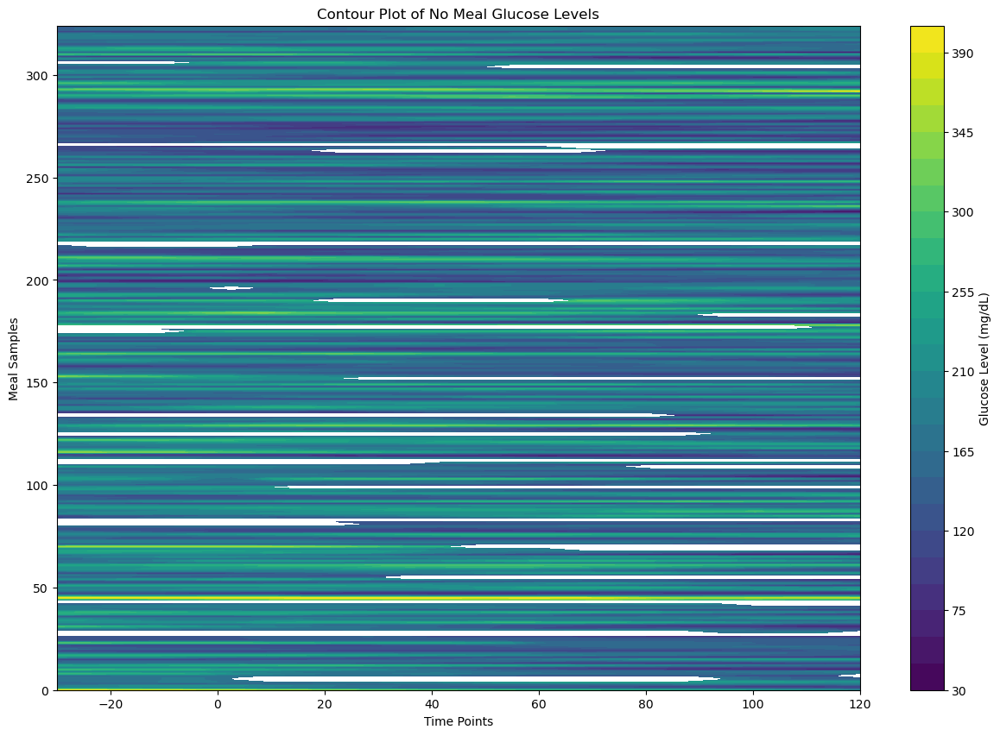

In [79]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, no_meal_data_matrix_2_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of No Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

## Handle Missing Data

We will use a strategy of deleting rows of data that have more than 10% of bad data.  If less than 10%, we will use KNN with a nearest neighbor hyperparameter (K=7).

### Define Threshold for Dumping Data

In [80]:
# 10%
dump_thresold = 0.1

### Create KNN Imputer

In [81]:
knn_imputer = KNNImputer(n_neighbors=7)

### Parse Meal Data and Handle Missing Values

In [82]:
cleaned_meal_data_1 = []
for row in meal_data_matrix_1:

    proportion_missing_data = np.isnan(row).mean()

    if proportion_missing_data > dump_thresold:

        # Ignore this row
        print(f"Ignoring row with {proportion_missing_data*100:.2f}% missing data")
        continue

    else:
        # The data is good, use it
        cleaned_meal_data_1.append(row)

Ignoring row with 13.33% missing data
Ignoring row with 73.33% missing data
Ignoring row with 66.67% missing data
Ignoring row with 13.33% missing data
Ignoring row with 30.00% missing data
Ignoring row with 16.67% missing data
Ignoring row with 23.33% missing data
Ignoring row with 16.67% missing data
Ignoring row with 26.67% missing data
Ignoring row with 30.00% missing data
Ignoring row with 20.00% missing data
Ignoring row with 73.33% missing data
Ignoring row with 63.33% missing data
Ignoring row with 100.00% missing data
Ignoring row with 100.00% missing data
Ignoring row with 33.33% missing data
Ignoring row with 16.67% missing data
Ignoring row with 16.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 60.00% missing data
Ignoring row with 16.67% missing data
Ignoring row with 36.67% missing data
Ignoring row with 43.33% missing data
Ignoring row with 13.33% missing data
Ignoring row with 13.33% missing data
Ignoring row with 60.00% missing data
Ignoring 

In [83]:
cleaned_meal_data_2 = []
for row in meal_data_matrix_2:

    proportion_missing_data = np.isnan(row).mean()

    if proportion_missing_data > dump_thresold:

        # Ignore this row
        print(f"Ignoring row with {proportion_missing_data*100:.2f}% missing data")
        continue

    else:
        # The data is good, use it
        cleaned_meal_data_2.append(row)

Ignoring row with 43.33% missing data
Ignoring row with 43.33% missing data
Ignoring row with 30.00% missing data
Ignoring row with 63.33% missing data
Ignoring row with 36.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 66.67% missing data
Ignoring row with 26.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 56.67% missing data
Ignoring row with 53.33% missing data
Ignoring row with 70.00% missing data
Ignoring row with 20.00% missing data
Ignoring row with 16.67% missing data
Ignoring row with 20.00% missing data
Ignoring row with 100.00% missing data
Ignoring row with 100.00% missing data
Ignoring row with 16.67% missing data
Ignoring row with 13.33% missing data
Ignoring row with 100.00% missing data
Ignoring row with 60.00% missing data
Ignoring row with 80.00% missing data
Ignoring row with 36.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 56.67% missing data
Ignoring row with 63.33% missing data
Ignori

In [84]:
cleaned_meal_data_1[0]

array([121., 120., 115., 110., 106., 103., 103., 101.,  nan, 131., 109.,
        82.,  74.,  66.,  73.,  82.,  87.,  90.,  83.,  73.,  49.,  58.,
        69.,  79.,  nan,  93.,  92.,  86.,  84.,  80.])

In [85]:
cleaned_meal_data_2[0]

array([390., 391., 389., 383., 375., 368., 357., 349., 336., 326., 315.,
       305., 295., 286., 279., 273., 268., 259., 252., 246., 238., 229.,
       218., 206., 195., 192., 181., 165., 139., 133.])

### Convert Cleaned Meal Data List into a Matrix

In [86]:
cleaned_meal_data_matrix_1 = \
    np.array(cleaned_meal_data_1)

In [87]:
cleaned_meal_data_matrix_2 = \
    np.array(cleaned_meal_data_2)

### Use KNN to Impute NaNs in Cleaned Meal Data

In [88]:
cleaned_imputed_meal_matrix_1 = knn_imputer.fit_transform(cleaned_meal_data_matrix_1)

In [89]:
cleaned_imputed_meal_matrix_2 = knn_imputer.fit_transform(cleaned_meal_data_matrix_2)

In [90]:
cleaned_imputed_meal_matrix_1[0]

array([121.        , 120.        , 115.        , 110.        ,
       106.        , 103.        , 103.        , 101.        ,
        99.71428571, 131.        , 109.        ,  82.        ,
        74.        ,  66.        ,  73.        ,  82.        ,
        87.        ,  90.        ,  83.        ,  73.        ,
        49.        ,  58.        ,  69.        ,  79.        ,
        75.85714286,  93.        ,  92.        ,  86.        ,
        84.        ,  80.        ])

In [91]:
cleaned_imputed_meal_matrix_1.shape

(619, 30)

In [92]:
cleaned_imputed_meal_matrix_2[0]

array([390., 391., 389., 383., 375., 368., 357., 349., 336., 326., 315.,
       305., 295., 286., 279., 273., 268., 259., 252., 246., 238., 229.,
       218., 206., 195., 192., 181., 165., 139., 133.])

In [93]:
cleaned_imputed_meal_matrix_2.shape

(325, 30)

### Parse No Meal Data and Handle Missing Values

In [94]:
cleaned_no_meal_data_1 = []
for row in no_meal_data_matrix_1:

    proportion_missing_data = np.isnan(row).mean()

    if proportion_missing_data > dump_thresold:

        # Ignore this row
        print(f"Ignoring row with {proportion_missing_data*100:.2f}% missing data")
        continue

    else:
        # The data is good, use it
        cleaned_no_meal_data_1.append(row)

Ignoring row with 20.83% missing data
Ignoring row with 58.33% missing data
Ignoring row with 12.50% missing data
Ignoring row with 33.33% missing data
Ignoring row with 12.50% missing data
Ignoring row with 41.67% missing data
Ignoring row with 79.17% missing data
Ignoring row with 16.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 100.00% missing data
Ignoring row with 100.00% missing data
Ignoring row with 66.67% missing data
Ignoring row with 50.00% missing data
Ignoring row with 16.67% missing data
Ignoring row with 29.17% missing data
Ignoring row with 12.50% missing data
Ignoring row with 66.67% missing data
Ignoring row with 83.33% missing data
Ignoring row with 12.50% missing data
Ignoring row with 16.67% missing data
Ignoring row with 20.83% missing data
Ignoring row with 54.17% missing data
Ignoring row with 100.00% missing data
Ignoring row with 91.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 12.50% missing data
Ignorin

In [95]:
cleaned_no_meal_data_2 = []
for row in no_meal_data_matrix_2:

    proportion_missing_data = np.isnan(row).mean()

    if proportion_missing_data > dump_thresold:

        # Ignore this row
        print(f"Ignoring row with {proportion_missing_data*100:.2f}% missing data")
        continue

    else:
        # The data is good, use it
        cleaned_no_meal_data_2.append(row)

Ignoring row with 54.17% missing data
Ignoring row with 54.17% missing data
Ignoring row with 100.00% missing data
Ignoring row with 83.33% missing data
Ignoring row with 16.67% missing data
Ignoring row with 100.00% missing data
Ignoring row with 58.33% missing data
Ignoring row with 37.50% missing data
Ignoring row with 50.00% missing data
Ignoring row with 37.50% missing data
Ignoring row with 100.00% missing data
Ignoring row with 70.83% missing data
Ignoring row with 29.17% missing data
Ignoring row with 45.83% missing data
Ignoring row with 100.00% missing data
Ignoring row with 79.17% missing data
Ignoring row with 75.00% missing data
Ignoring row with 62.50% missing data
Ignoring row with 16.67% missing data
Ignoring row with 91.67% missing data
Ignoring row with 20.83% missing data
Ignoring row with 29.17% missing data
Ignoring row with 20.83% missing data
Ignoring row with 100.00% missing data
Ignoring row with 33.33% missing data
Ignoring row with 37.50% missing data
Ignorin

In [96]:
cleaned_no_meal_data_1[0]

array([121., 120., 115., 110., 106., 103., 103., 101.,  nan, 131., 109.,
        82.,  74.,  66.,  73.,  82.,  87.,  90.,  83.,  73.,  49.,  58.,
        69.,  79.])

In [97]:
cleaned_no_meal_data_2[0]

array([390., 391., 389., 383., 375., 368., 357., 349., 336., 326., 315.,
       305., 295., 286., 279., 273., 268., 259., 252., 246., 238., 229.,
       218., 206.])

In [98]:
cleaned_no_meal_data_1[0].shape

(24,)

In [99]:
cleaned_no_meal_data_2[0].shape

(24,)

### Convert Cleaned No Meal Data List into a Matrix

In [100]:
cleaned_no_meal_data_matrix_1 = \
    np.array(cleaned_no_meal_data_1)

In [101]:
cleaned_no_meal_data_matrix_2 = \
    np.array(cleaned_no_meal_data_2)

### Use KNN to Impute NaNs in Cleaned No Meal Data

In [102]:
cleaned_imputed_no_meal_matrix_1 = knn_imputer.fit_transform(cleaned_no_meal_data_matrix_1)

In [103]:
cleaned_imputed_no_meal_matrix_2 = knn_imputer.fit_transform(cleaned_no_meal_data_matrix_2)

In [104]:
cleaned_imputed_no_meal_matrix_1[0]

array([121.        , 120.        , 115.        , 110.        ,
       106.        , 103.        , 103.        , 101.        ,
       103.85714286, 131.        , 109.        ,  82.        ,
        74.        ,  66.        ,  73.        ,  82.        ,
        87.        ,  90.        ,  83.        ,  73.        ,
        49.        ,  58.        ,  69.        ,  79.        ])

In [105]:
cleaned_imputed_no_meal_matrix_2[0]

array([390., 391., 389., 383., 375., 368., 357., 349., 336., 326., 315.,
       305., 295., 286., 279., 273., 268., 259., 252., 246., 238., 229.,
       218., 206.])

## Visualize Cleaned Imputed Data

### Visualize Cleaned Imputed Meal Data Matrix 1

#### Heatmap of Cleaned Imputed Meal Data Matrix 1

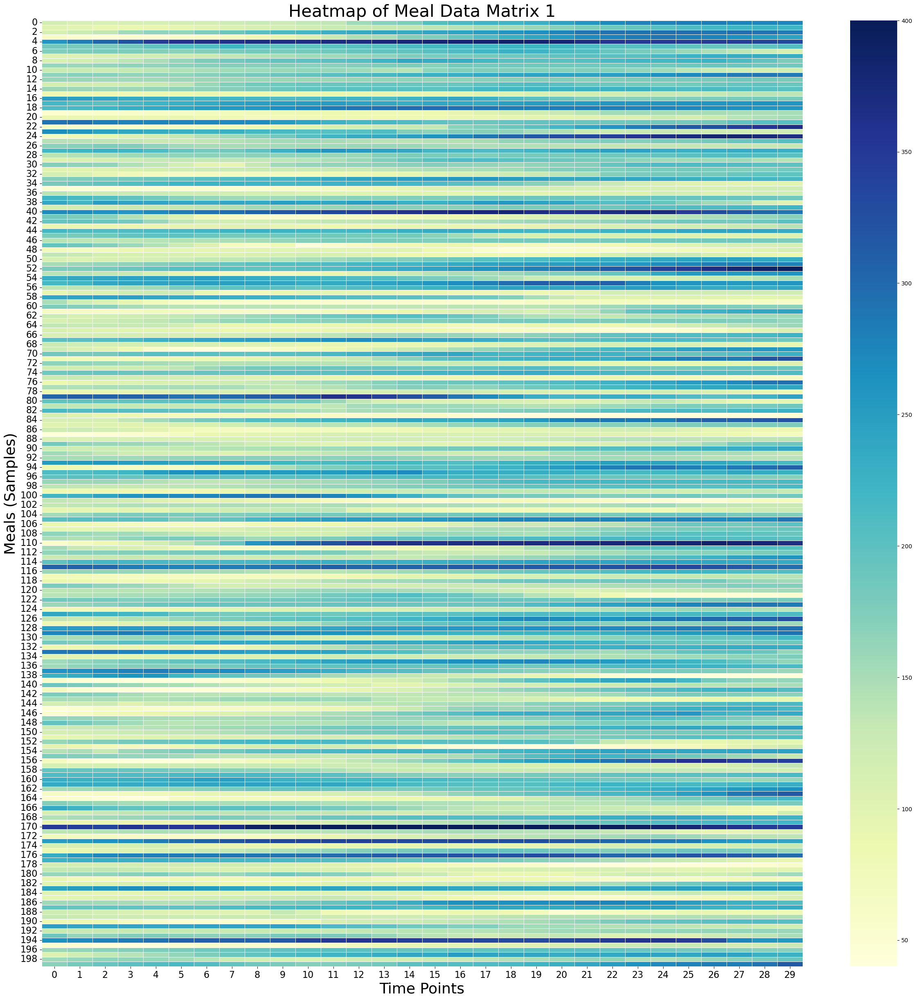

In [106]:
# Create the heatmap
sampled_meal_data_matrix_1 = cleaned_imputed_meal_matrix_1[np.random.choice(cleaned_imputed_meal_matrix_1.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_meal_data_matrix_1, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of Meal Data Matrix 1', fontsize=30)
plt.xlabel('Time Points', fontsize=26)
plt.ylabel('Meals (Samples)', fontsize=26)

# Change font properties for the x and y tick labels
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.show()

#### Surface Plot of Cleaned Imputed Meal Data Matrix 1

In [107]:
# Create X, Y meshgrid
X = np.arange(cleaned_imputed_meal_matrix_1.shape[1])
Y = np.arange(cleaned_imputed_meal_matrix_1.shape[0])
time_points = np.linspace(-30, 120, 30)  # X-axis: from -30 minutes to +120 minutes (30 time points)
meal_numbers = np.arange(1, len(meal_data_1) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [108]:
X

array([[-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       ...,
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ]])

In [109]:
X.shape

(619, 30)

In [110]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [616, 616, 616, ..., 616, 616, 616],
       [617, 617, 617, ..., 617, 617, 617],
       [618, 618, 618, ..., 618, 618, 618]])

In [111]:
# Fill NaNs using forward fill, then backward fill
meal_data_matrix_1_df = pd.DataFrame(cleaned_imputed_meal_matrix_1)
meal_data_matrix_1_filled = meal_data_matrix_1_df.ffill().bfill().values

In [112]:
# Apply a moving average smoothing to each row
window_size = 3  # Choose a window size for smoothing
smoothed_meal_data_matrix_1 = np.array([uniform_filter1d(row, size=window_size) for row in meal_data_matrix_1_filled])

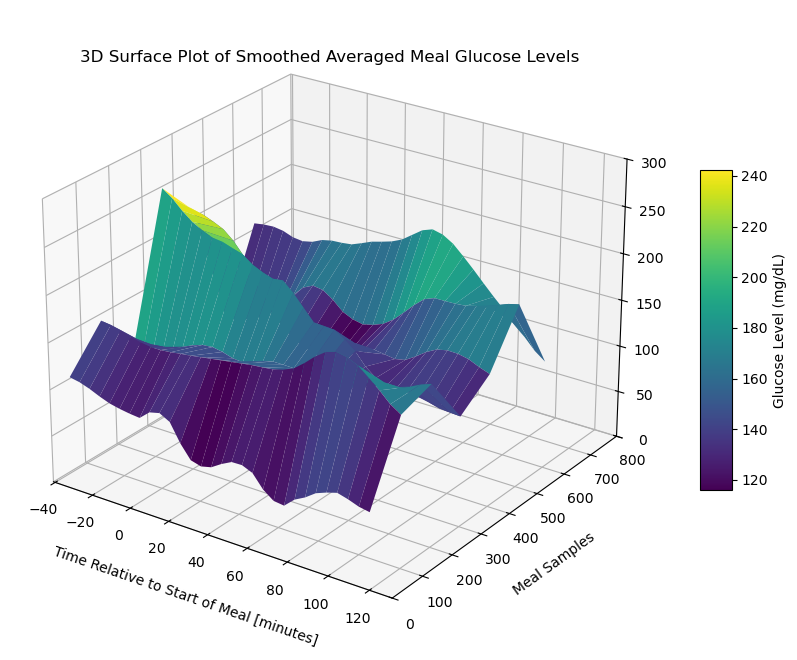

In [113]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_meal_data_matrix_1[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to Start of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
ax.set_ylim(0, 800)
ax.set_zlim(0, 300)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of Cleaned Imputed Meal Data Matrix 1

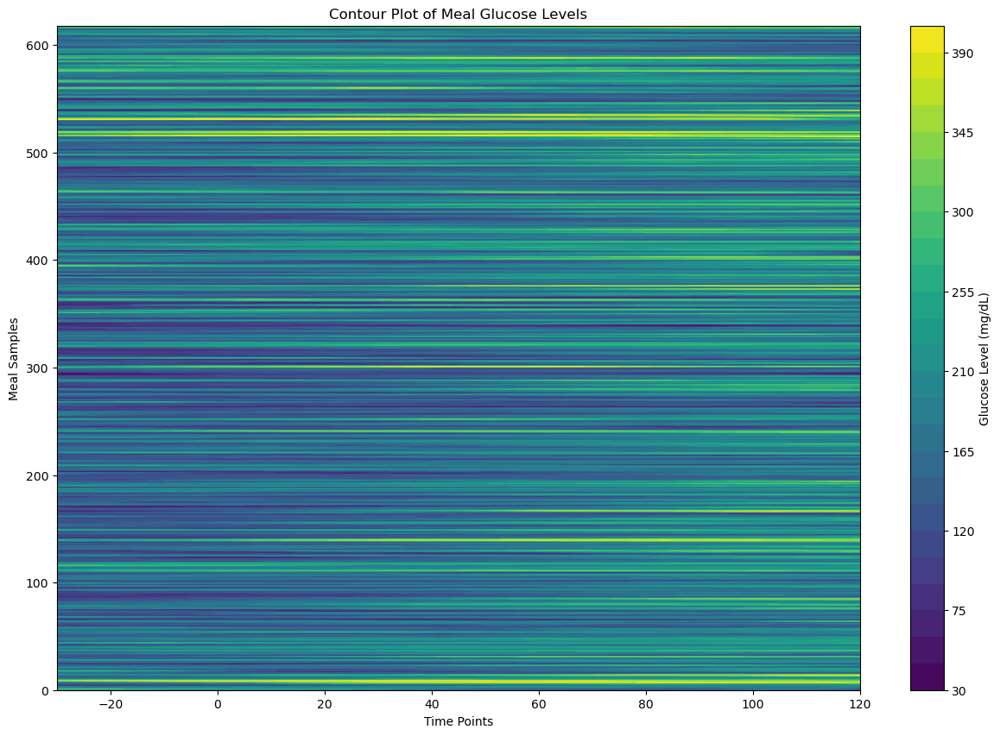

In [114]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, meal_data_matrix_1_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

### Visualize Cleaned Imputed Meal Data Matrix 2

#### Heatmap of Cleaned Imputed Meal Data Matrix 2

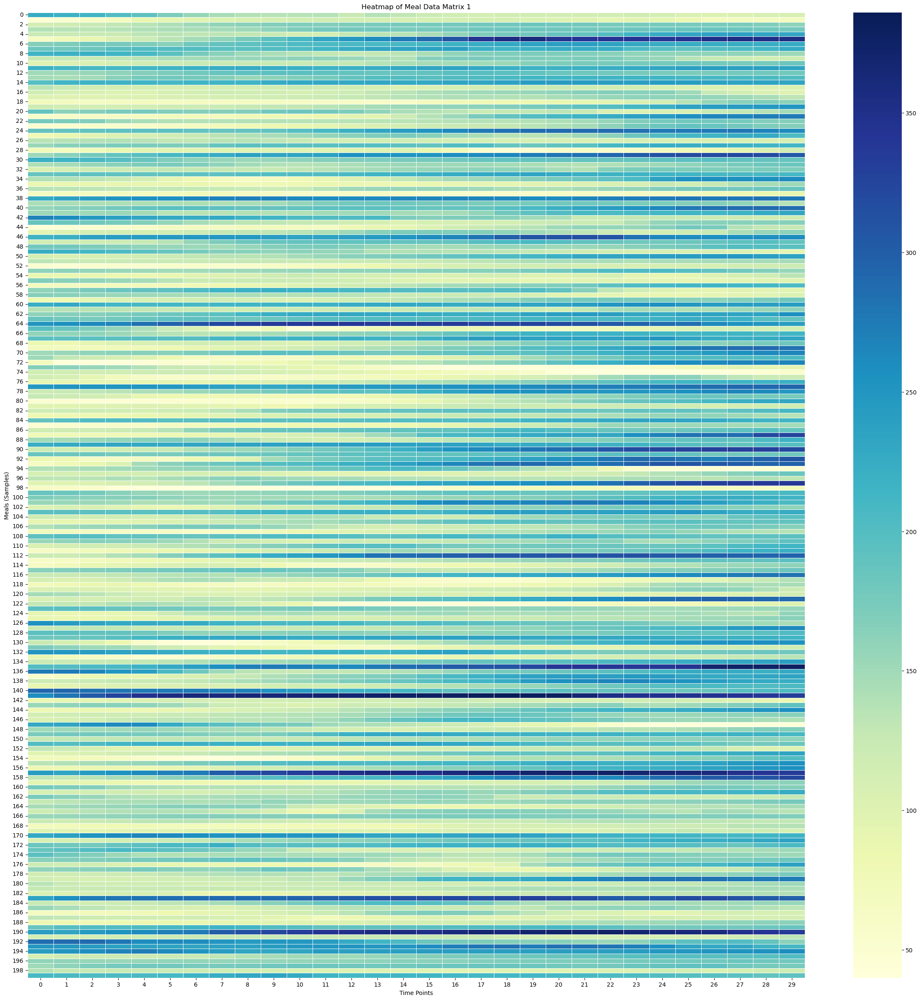

In [115]:
# Create the heatmap
sampled_meal_data_matrix_2 = cleaned_imputed_meal_matrix_1[np.random.choice(cleaned_imputed_meal_matrix_2.shape[0], 200, replace=False)]
plt.figure(figsize=(30, 30))
sns.heatmap(sampled_meal_data_matrix_2, cmap='YlGnBu', linewidths=0.5, annot=False, vmin=None, vmax=None)
plt.title('Heatmap of Meal Data Matrix 1')
plt.xlabel('Time Points')
plt.ylabel('Meals (Samples)')
plt.show()

#### Surface Plot of Cleaned Imputed Meal Data Matrix 2

In [116]:
# Create X, Y meshgrid
X = np.arange(cleaned_imputed_meal_matrix_2.shape[1])
Y = np.arange(cleaned_imputed_meal_matrix_2.shape[0])
time_points = np.linspace(-30, 120, 30)  # X-axis: from -30 minutes to +120 minutes (30 time points)
meal_numbers = np.arange(1, len(meal_data_2) + 1)
X, Y = np.meshgrid(time_points, Y)
#X, Y = np.meshgrid(time_points, meal_numbers)

In [117]:
X

array([[-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       ...,
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ],
       [-30.        , -24.82758621, -19.65517241, ..., 109.65517241,
        114.82758621, 120.        ]])

In [118]:
X.shape

(325, 30)

In [119]:
Y

array([[  0,   0,   0, ...,   0,   0,   0],
       [  1,   1,   1, ...,   1,   1,   1],
       [  2,   2,   2, ...,   2,   2,   2],
       ...,
       [322, 322, 322, ..., 322, 322, 322],
       [323, 323, 323, ..., 323, 323, 323],
       [324, 324, 324, ..., 324, 324, 324]])

In [120]:
# Fill NaNs using forward fill, then backward fill
meal_data_matrix_2_df = pd.DataFrame(cleaned_imputed_meal_matrix_2)
meal_data_matrix_2_filled = meal_data_matrix_2_df.ffill().bfill().values

In [121]:
# Apply a moving average smoothing to each row
window_size = 3  # Choose a window size for smoothing
smoothed_meal_data_matrix_2 = np.array([uniform_filter1d(row, size=window_size) for row in meal_data_matrix_2_filled])

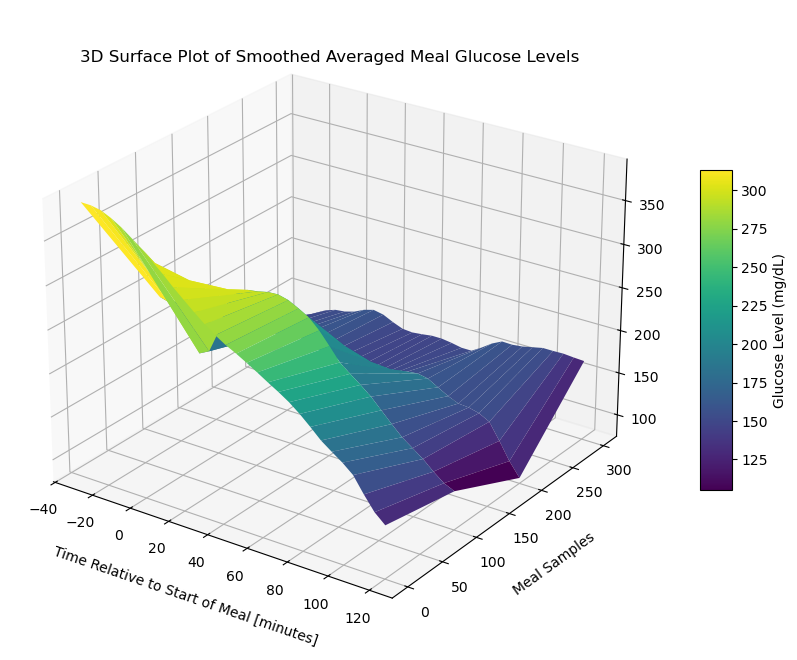

In [122]:
# Create the plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
stride = 100

# Plot the surface
surface_plot = ax.plot_surface(X[::stride], Y[::stride], smoothed_meal_data_matrix_2[::stride], cmap='viridis', edgecolor='none')
ax.set_title('3D Surface Plot of Smoothed Averaged Meal Glucose Levels', y=0.985)
ax.set_xlabel('Time Relative to Start of Meal [minutes]', labelpad=10)
ax.set_ylabel('Meal Samples', labelpad=10)
#ax.set_zlabel('Glucose Level (mg/dL)', labelpad=30)

#ax.set_xticks(np.linspace(-30, 120, 7))

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)
#ax.set_zlim(0, 300)

fig.colorbar(surface_plot, ax=ax, shrink=0.5, aspect=10, label='Glucose Level (mg/dL)')

#plt.tight_layout()
fig.subplots_adjust(left=0.01, right=1, top=0.9, bottom=0.1)

ax.view_init(elev=25, azim=-55)

plt.show()

#### Contour Plot of Cleaned Imputed Meal Data Matrix 2

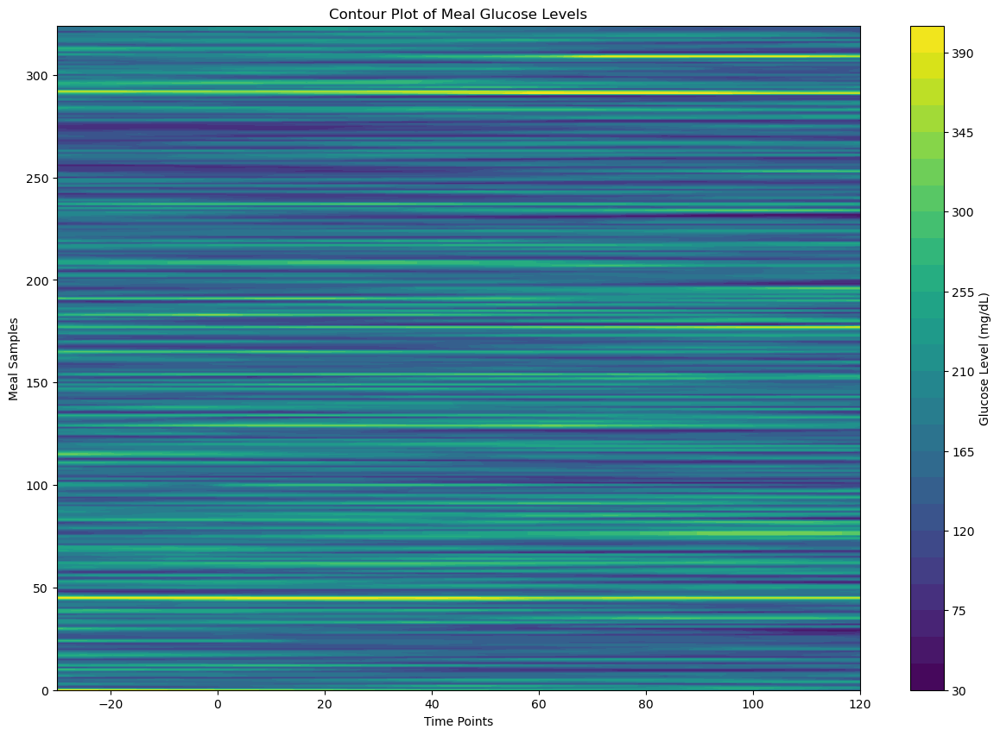

In [123]:
# Create the contour plot
plt.figure(figsize=(15, 10))
plt.contourf(X, Y, meal_data_matrix_2_df, cmap='viridis', levels=30)
plt.colorbar(label='Glucose Level (mg/dL)')
plt.title('Contour Plot of Meal Glucose Levels')
plt.xlabel('Time Points')
plt.ylabel('Meal Samples')
plt.show()

## Combine Patient 1 and Patient 2 Data

In [124]:
cleaned_imputed_meal_matrix = \
    np.vstack((cleaned_imputed_meal_matrix_1, cleaned_imputed_meal_matrix_2))

In [125]:
cleaned_imputed_no_meal_matrix = \
    np.vstack((cleaned_imputed_no_meal_matrix_1, cleaned_imputed_no_meal_matrix_2))

## Feature Extraction

### Define Feature Extractor Helper Functions

In [126]:
def compute_first_derivative(glucose_data, delta_t=5):
    return np.diff(glucose_data) / delta_t

In [127]:
def compute_second_derivative(glucose_values, delta_t=5):
    second_derivative = np.zeros(len(glucose_values) - 2)
    for i in range(1, len(glucose_values) - 1):
        second_derivative[i - 1] = \
            (glucose_values[i + 1] - 2 * glucose_values[i] + glucose_values[i - 1]) / (delta_t ** 2)
    return second_derivative

In [128]:
compute_first_derivative(cleaned_imputed_meal_matrix[0])

array([-0.2       , -1.        , -1.        , -0.8       , -0.6       ,
        0.        , -0.4       , -0.25714286,  6.25714286, -4.4       ,
       -5.4       , -1.6       , -1.6       ,  1.4       ,  1.8       ,
        1.        ,  0.6       , -1.4       , -2.        , -4.8       ,
        1.8       ,  2.2       ,  2.        , -0.62857143,  3.42857143,
       -0.2       , -1.2       , -0.4       , -0.8       ])

In [129]:
compute_second_derivative(cleaned_imputed_meal_matrix[0])

array([-0.16      ,  0.        ,  0.04      ,  0.04      ,  0.12      ,
       -0.08      ,  0.02857143,  1.30285714, -2.13142857, -0.2       ,
        0.76      ,  0.        ,  0.6       ,  0.08      , -0.16      ,
       -0.08      , -0.4       , -0.12      , -0.56      ,  1.32      ,
        0.08      , -0.04      , -0.52571429,  0.81142857, -0.72571429,
       -0.2       ,  0.16      , -0.08      ])

In [130]:
def compute_AUC(glucose_values, delta_t=5):
    return simpson(glucose_values, dx=delta_t)

### Define Feature Extractor Function

In [131]:
#| label: CSE572_Code_4
def feature_extractor(data_matrix):

    features = []

    for row in data_matrix:
        mean_glucose = np.mean(row)
        std_glucose  = np.std(row)
        max_glucose  = np.max(row)
        min_glucose  = np.min(row)
        
        first_derivative = compute_first_derivative(row)
        mean_first_derivate = np.mean(first_derivative)

        if len(row) > 2:
            second_derivative = compute_second_derivative(row)
            mean_second_derivative = np.mean(second_derivative)
        else:
            mean_second_derivative = 0

        AUC = compute_AUC(row)

        time_to_peak = np.argmax(row)

        features_vector = [
            mean_glucose,
            std_glucose,
            max_glucose,
            min_glucose,
            mean_first_derivate,
            mean_second_derivative,
            AUC,
            time_to_peak
        ]

        features.append(features_vector)
    
    return np.array(features)

### Get Feature Matrix for Cleaned Imputed Meal Data

In [132]:
meal_features_matrix = feature_extractor(cleaned_imputed_meal_matrix)
meal_features_matrix[0]

array([ 8.98190476e+01,  1.91175360e+01,  1.31000000e+02,  4.90000000e+01,
       -2.82758621e-01, -4.28571429e-03,  1.30310714e+04,  9.00000000e+00])

### Get Feature Matrix for Clean Imputed No Meal Data

In [133]:
no_meal_features_matrix = feature_extractor(cleaned_imputed_no_meal_matrix)
no_meal_features_matrix[0]

array([ 9.11607143e+01,  2.10808822e+01,  1.31000000e+02,  4.90000000e+01,
       -3.65217391e-01,  2.00000000e-02,  1.04699405e+04,  9.00000000e+00])

## Visualize The Meal Features Matrix

### Normalize The Data

In [134]:
scaler = StandardScaler()
scaled_meal_features_matrix = scaler.fit_transform(meal_features_matrix)
scaled_no_meal_features_matrix = scaler.fit_transform(no_meal_features_matrix)

In [135]:
scaled_meal_features_matrix[0]

array([-1.43931653, -0.6890434 , -1.43186426, -1.35409331, -0.73789252,
       -0.2568468 , -1.42698567, -0.72547238])

In [136]:
scaled_no_meal_features_matrix[0]

array([-1.24861858, -0.24758492, -1.16121642, -1.39218291, -0.66468096,
        1.06439767, -1.24077771, -0.41467362])

### Plot Features for all Rows

In [137]:
meal_features_matrix.shape[0]

944

In [138]:
X = np.arange(
        start=0,
        stop=meal_features_matrix.shape[0]
    )

#### Plot Max, Mean, Min, and Std Dev for All Rows

In [139]:
Y_mean = meal_features_matrix[:, 0] # First column
Y_mean_peaks, _ = find_peaks(Y_mean, height=20)

Y_mean_peaks_times = X[Y_mean_peaks]
Y_mean_peaks_values = Y_mean[Y_mean_peaks]

window_size = 3
Y_mean_peaks_moving_avg = np.convolve(Y_mean_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [140]:
Y_std = meal_features_matrix[:, 1] # Second column

In [141]:
Y_max = meal_features_matrix[:, 2] # Third column
Y_max_peaks, _ = find_peaks(Y_max, height=20)

Y_max_peaks_times = X[Y_max_peaks]
Y_max_peaks_values = Y_max[Y_max_peaks]

window_size = 3
Y_max_peaks_moving_avg = np.convolve(Y_max_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [142]:
Y_max_peaks_times.shape

(289,)

In [143]:
Y_max_peaks_moving_avg.shape

(287,)

In [144]:
Y_min = meal_features_matrix[:, 3] # Fourth column
Y_min_peaks, _ = find_peaks(Y_min, height=20)

Y_min_peaks_times = X[Y_min_peaks]
Y_min_peaks_values = Y_min[Y_min_peaks]

window_size = 3
Y_min_peaks_moving_avg = np.convolve(Y_min_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [145]:
Y_min_peaks_moving_avg.shape

(281,)

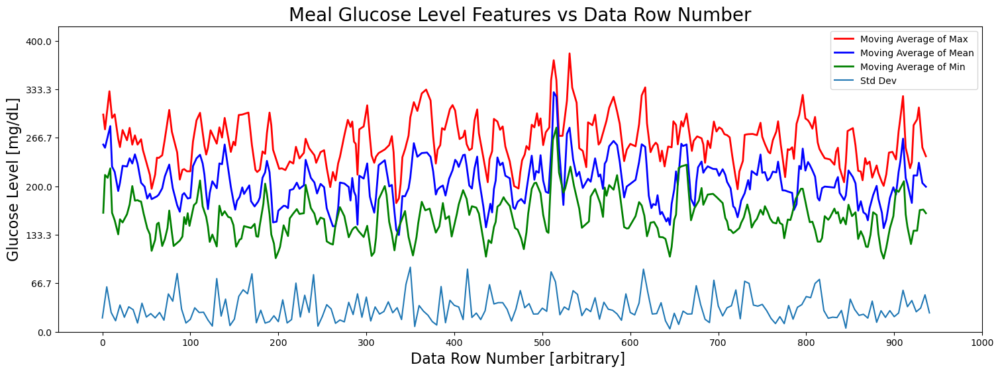

In [146]:
# Create the plot
fig = plt.figure(figsize=(18, 6))
ax = fig.add_subplot(111)
stride = 5

# Plot the features
#ax.plot(X[::stride], Y_max[::stride], 'x', label='Max', color='red')
ax.plot(Y_max_peaks_times[:len(Y_max_peaks_moving_avg)], Y_max_peaks_moving_avg, color='red', label='Moving Average of Max', linewidth=2)

#ax.plot(X[::stride], Y_mean[::stride], label='Mean', color='blue')
ax.plot(Y_mean_peaks_times[:len(Y_mean_peaks_moving_avg)], Y_mean_peaks_moving_avg, color='blue', label='Moving Average of Mean', linewidth=2)

#ax.plot(X[::stride], Y_min[::stride], 'x', label='Min')
ax.plot(Y_min_peaks_times[:len(Y_min_peaks_moving_avg)], Y_min_peaks_moving_avg, color='green', label='Moving Average of Min', linewidth=2)

ax.plot(X[::stride], Y_std[::stride], label='Std Dev')

ax.set_title('Meal Glucose Level Features vs Data Row Number', fontsize=20)
ax.set_xlabel('Data Row Number [arbitrary] ', fontsize=16)
ax.set_ylabel('Glucose Level [mg/dL]', fontsize=16)

ax.set_xticks(np.linspace(0, 1000, 11))
ax.set_yticks(np.linspace(0, 400, 7))
ax.set_xlim(-50, 1000)
ax.set_ylim(0, 420)

#ax.text(300, 380, f'Viewing every {stride} rows')

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)

#plt.tight_layout()

plt.legend()

plt.show()

#### Plot First and Second Derivatives

In [147]:
Y_mean_first_derivative = meal_features_matrix[:, 4] # Fourth column
Y_mean_first_derivative_peaks, _ = find_peaks(Y_mean_first_derivative, height=None)

Y_mean_first_derivative_times = X[Y_mean_first_derivative_peaks]
Y_mean_first_derivative_values = Y_mean_first_derivative[Y_mean_first_derivative_peaks]

window_size = 3
Y_mean_first_derivative_peaks_moving_avg = \
    np.convolve(
        Y_mean_first_derivative_values,
        np.ones(window_size)/window_size, mode='valid'
    )

In [148]:
Y_mean_2nd_derivative = meal_features_matrix[:, 5] # Fourth column
Y_mean_2nd_derivative_peaks, _ = find_peaks(Y_mean_2nd_derivative, height=None)

Y_mean_2nd_derivative_times = X[Y_mean_2nd_derivative_peaks]
Y_mean_2nd_derivative_values = Y_mean_2nd_derivative[Y_mean_2nd_derivative_peaks]

window_size = 3
Y_mean_2nd_derivative_peaks_moving_avg = \
    np.convolve(
        Y_mean_2nd_derivative_values,
        np.ones(window_size)/window_size, mode='valid'
    )

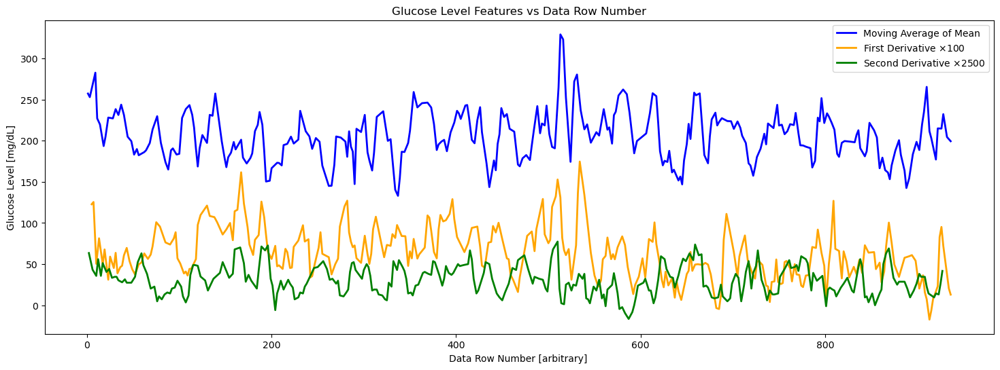

In [149]:
# Create the plot
fig = plt.figure(figsize=(18, 6))
ax = fig.add_subplot(111)
stride = 5

# Plot the features
#ax.plot(X[::stride], Y_max[::stride], 'x', label='Max', color='red')
#ax.plot(
#    Y_max_peaks_times[:len(Y_max_peaks_moving_avg)], 
#    Y_max_peaks_moving_avg, 
#    color='red', 
#    label='Moving Average of Max', 
#    linewidth=2)

#ax.plot(X[::stride], Y_mean[::stride], label='Mean', color='blue')
ax.plot(
    Y_mean_peaks_times[:len(Y_mean_peaks_moving_avg)], 
    Y_mean_peaks_moving_avg, 
    color='blue', 
    label='Moving Average of Mean', 
    linewidth=2
)

#ax.plot(X[::stride], Y_min[::stride], 'x', label='Min')
#ax.plot(Y_min_peaks_times[:len(Y_min_peaks_moving_avg)], Y_min_peaks_moving_avg, color='green', label='Moving Average of Min', linewidth=2)

#ax.plot(X[::stride], Y_std[::stride], label='Std Dev')

ax.plot(
    Y_mean_first_derivative_times[:len(Y_mean_first_derivative_peaks_moving_avg)],
    Y_mean_first_derivative_peaks_moving_avg*100,
    color='orange',
    label=r'First Derivative $\times 100$',
    linewidth=2
)

ax.plot(
    Y_mean_2nd_derivative_times[:len(Y_mean_2nd_derivative_peaks_moving_avg)],
    Y_mean_2nd_derivative_peaks_moving_avg*2500,
    color='green',
    label=r'Second Derivative $\times 2500$',
    linewidth=2
)

ax.set_title('Glucose Level Features vs Data Row Number')
ax.set_xlabel('Data Row Number [arbitrary] ')
ax.set_ylabel('Glucose Level [mg/dL]')

#ax.set_xticks(np.linspace(0, 1000, 11))
#ax.set_yticks(np.linspace(0, 400, 7))
#ax.set_xlim(-50, 1000)
#ax.set_ylim(0, 420)

#ax.text(300, 380, f'Viewing every {stride} rows')

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)

#plt.tight_layout()

plt.legend()

plt.show()

### Pairwise Plot of Meal Features Matrix

<Figure size 1500x1500 with 0 Axes>

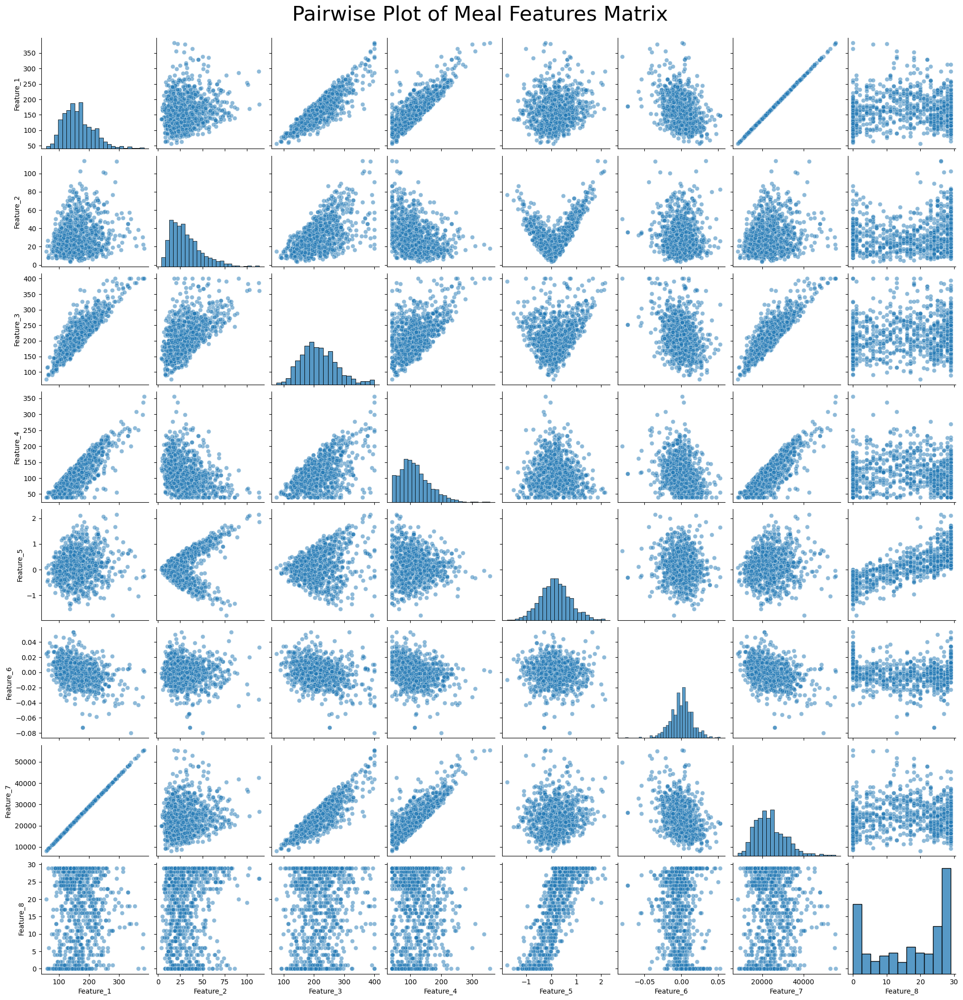

In [150]:
# Generate column labels for the features
feature_columns = [f'Feature_{i+1}' for i in range(meal_features_matrix.shape[1])]

# Convert the feature matrix to a Pandas DataFrame
df = pd.DataFrame(meal_features_matrix, columns=feature_columns)

# Create a pairwise plot using Seaborn
plt.figure(figsize=(15, 15))  # Adjust figure size as needed
sns.pairplot(df, diag_kind='hist', plot_kws={'alpha': 0.5, 's': 40})

plt.suptitle('Pairwise Plot of Meal Features Matrix', y=1.02, fontsize=30)

# Show the plot
plt.show()

## Visualize The No Meal Features Matrix

### Normalize The Data

In [151]:
scaler = StandardScaler()
scaled_meal_features_matrix = scaler.fit_transform(meal_features_matrix)
scaled_no_meal_features_matrix = scaler.fit_transform(no_meal_features_matrix)

In [152]:
scaled_meal_features_matrix[0]

array([-1.43931653, -0.6890434 , -1.43186426, -1.35409331, -0.73789252,
       -0.2568468 , -1.42698567, -0.72547238])

In [153]:
scaled_no_meal_features_matrix[0]

array([-1.24861858, -0.24758492, -1.16121642, -1.39218291, -0.66468096,
        1.06439767, -1.24077771, -0.41467362])

### Plot Features for all Rows

In [154]:
no_meal_features_matrix.shape[0]

752

In [155]:
X = np.arange(
        start=0,
        stop=no_meal_features_matrix.shape[0]
    )

#### Plot Max, Mean, Min, and Std Dev for All Rows

In [156]:
Y_mean = no_meal_features_matrix[:, 0] # First column
Y_mean_peaks, _ = find_peaks(Y_mean, height=20)

Y_mean_peaks_times = X[Y_mean_peaks]
Y_mean_peaks_values = Y_mean[Y_mean_peaks]

window_size = 3
Y_mean_peaks_moving_avg = np.convolve(Y_mean_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [157]:
Y_std = no_meal_features_matrix[:, 1] # Second column

In [158]:
Y_max = no_meal_features_matrix[:, 2] # Third column
Y_max_peaks, _ = find_peaks(Y_max, height=20)

Y_max_peaks_times = X[Y_max_peaks]
Y_max_peaks_values = Y_max[Y_max_peaks]

window_size = 3
Y_max_peaks_moving_avg = np.convolve(Y_max_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [159]:
Y_max_peaks_times.shape

(238,)

In [160]:
Y_max_peaks_moving_avg.shape

(236,)

In [161]:
Y_min = no_meal_features_matrix[:, 3] # Fourth column
Y_min_peaks, _ = find_peaks(Y_min, height=20)

Y_min_peaks_times = X[Y_min_peaks]
Y_min_peaks_values = Y_min[Y_min_peaks]

window_size = 3
Y_min_peaks_moving_avg = np.convolve(Y_min_peaks_values, np.ones(window_size)/window_size, mode='valid')

In [162]:
Y_min_peaks_moving_avg.shape

(238,)

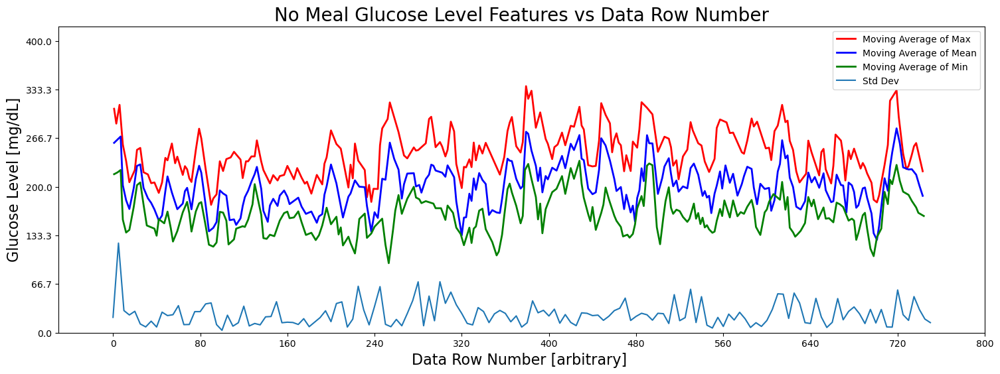

In [163]:
# Create the plot
fig = plt.figure(figsize=(18, 6))
ax = fig.add_subplot(111)
stride = 5

# Plot the features
#ax.plot(X[::stride], Y_max[::stride], 'x', label='Max', color='red')
ax.plot(Y_max_peaks_times[:len(Y_max_peaks_moving_avg)], Y_max_peaks_moving_avg, color='red', label='Moving Average of Max', linewidth=2)

#ax.plot(X[::stride], Y_mean[::stride], label='Mean', color='blue')
ax.plot(Y_mean_peaks_times[:len(Y_mean_peaks_moving_avg)], Y_mean_peaks_moving_avg, color='blue', label='Moving Average of Mean', linewidth=2)

#ax.plot(X[::stride], Y_min[::stride], 'x', label='Min')
ax.plot(Y_min_peaks_times[:len(Y_min_peaks_moving_avg)], Y_min_peaks_moving_avg, color='green', label='Moving Average of Min', linewidth=2)

ax.plot(X[::stride], Y_std[::stride], label='Std Dev')

ax.set_title('No Meal Glucose Level Features vs Data Row Number', fontsize=20)
ax.set_xlabel('Data Row Number [arbitrary] ', fontsize=16)
ax.set_ylabel('Glucose Level [mg/dL]', fontsize=16)

ax.set_xticks(np.linspace(0, 800, 11))
ax.set_yticks(np.linspace(0, 400, 7))
ax.set_xlim(-50, 800)
ax.set_ylim(0, 420)

#ax.text(300, 380, f'Viewing every {stride} rows')

# Adjust axis limits to create a zoom-out effect
#ax.set_xlim(-30, 120)
#ax.set_ylim(0, 800)

#plt.tight_layout()

plt.legend()

plt.show()

### Pairwise Plot of No Meal Features Matrix

<Figure size 1500x1500 with 0 Axes>

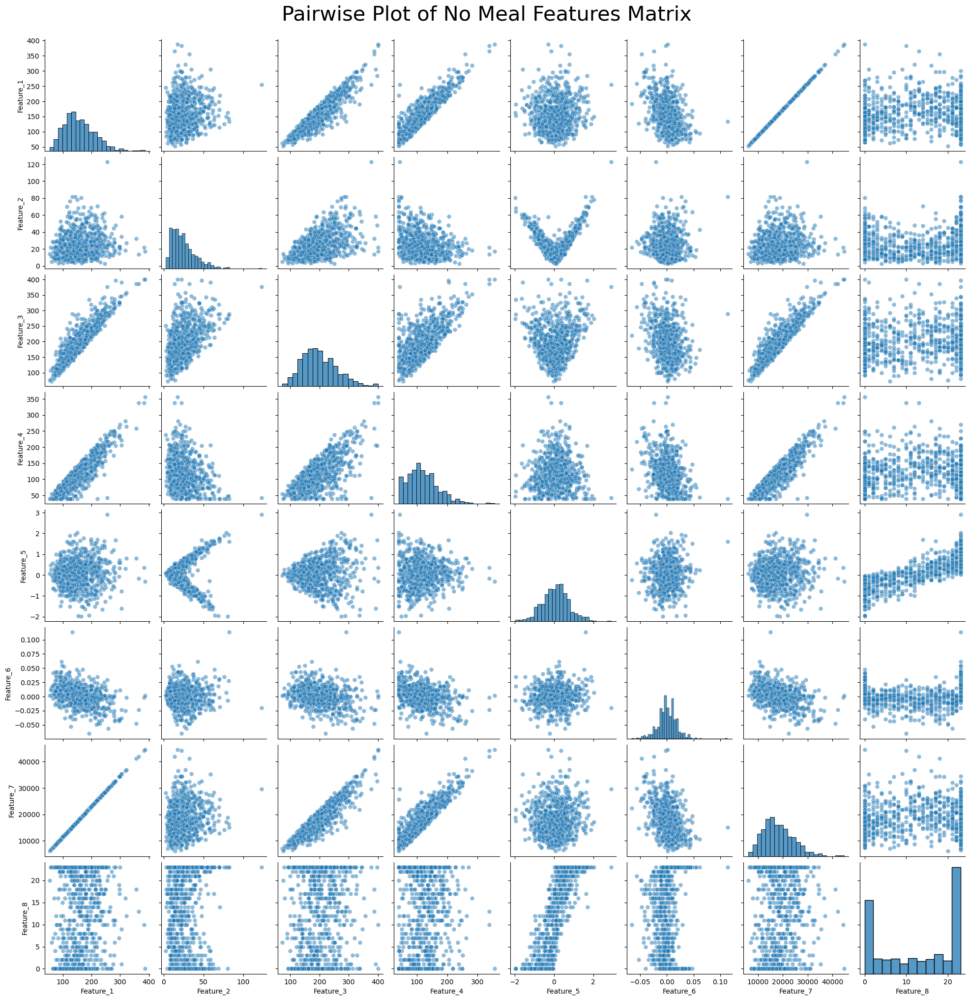

In [164]:
# Generate column labels for the features
feature_columns = [f'Feature_{i+1}' for i in range(meal_features_matrix.shape[1])]

# Convert the feature matrix to a Pandas DataFrame
df = pd.DataFrame(no_meal_features_matrix, columns=feature_columns)

# Create a pairwise plot using Seaborn
plt.figure(figsize=(15, 15))  # Adjust figure size as needed
sns.pairplot(df, diag_kind='hist', plot_kws={'alpha': 0.5, 's': 40})

plt.suptitle('Pairwise Plot of No Meal Features Matrix', y=1.02, fontsize=30)

# Show the plot
plt.show()

## Concatenate Feature Matrices and Add Class Labels

In [165]:
meal_labels = np.ones((meal_features_matrix.shape[0], 1))
len(meal_labels)

944

In [166]:
meal_features_matrix_with_labels = \
    np.hstack((meal_features_matrix, meal_labels))
#meal_features_matrix_with_labels[1]

In [167]:
no_meal_labels = np.zeros((no_meal_features_matrix.shape[0], 1))
len(no_meal_labels)

752

In [168]:
no_meal_features_matrix_with_labels = \
    np.hstack((no_meal_features_matrix, no_meal_labels))
#no_meal_features_matrix_with_labels[1]

In [169]:
concat_features = \
    np.vstack((meal_features_matrix_with_labels, no_meal_features_matrix_with_labels))
len(concat_features)

1696

## Train Support Vector Machine

### Use Standard Variable Names for Features and Class Label

In [170]:
X = concat_features[:, :-1]
y = concat_features[:, -1]

In [171]:
X[0]

array([ 8.98190476e+01,  1.91175360e+01,  1.31000000e+02,  4.90000000e+01,
       -2.82758621e-01, -4.28571429e-03,  1.30310714e+04,  9.00000000e+00])

In [172]:
y[0]

np.float64(1.0)

### Train / Test Split

In [173]:
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size = 0.2, random_state=40)

### Normalize The Data

In [174]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

### Train SVM Model

In [175]:
svm_model = SVC(kernel='linear', C=0.1)
svm_model.fit(X_train_scaled, y_train)

SVC(C=0.1, kernel='linear')

## Test SVM Model

In [176]:
y_pred = svm_model.predict(X_test_scaled)

### Obtain Accuracy of SVM Model

In [177]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 99.71%


### Obtain Training and Test Accuracy of SVM Model

In [178]:
train_accuracy = svm_model.score(X_train_scaled, y_train)
test_accuracy = svm_model.score(X_test_scaled, y_test)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 100.00%
Test Accuracy: 99.71%


### Obtain F1 Score of SVM Model

In [179]:
f1 = f1_score(y_test, y_pred)
print(f"F1 Score: {f1:.2f}")

F1 Score: 1.00


### Cross Validate SVM Model

In [180]:
scores = cross_val_score(svm_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print(f"Cross-Validation Accuracy: {scores.mean():.2f} (+/- {scores.std():.2f})")

Cross-Validation Accuracy: 1.00 (+/- 0.00)


## Visualize Results of SVM Model

### Scatter Plot with PCA

[[ 0.51111341  0.13118439  0.47327076  0.4251986   0.00643744 -0.257121
   0.50031459  0.01753109]
 [-0.03692307  0.31993471  0.1095569  -0.19047139  0.66528982  0.06390289
   0.01416038  0.63332595]]


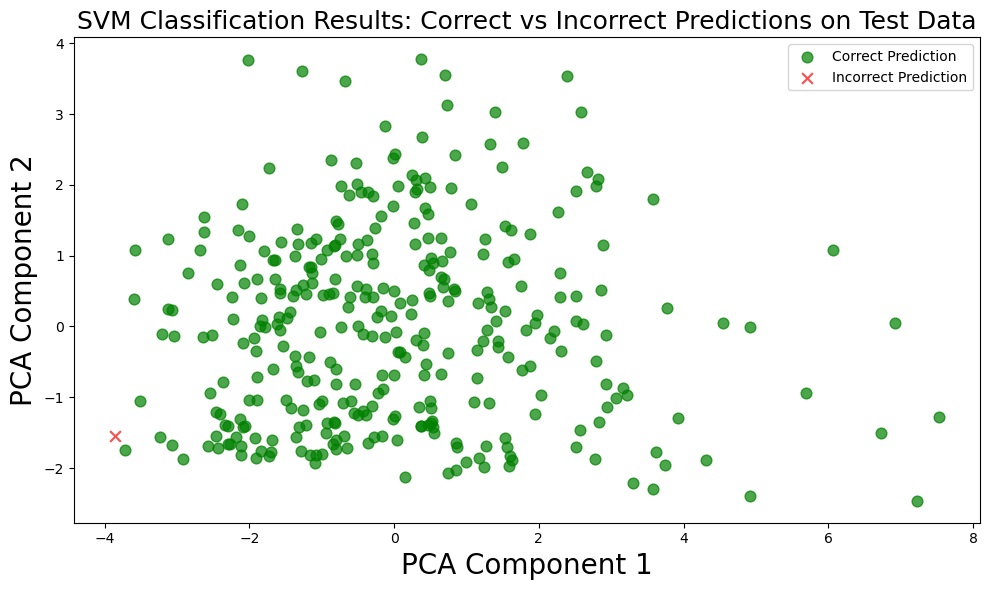

In [191]:
# Reduce dimensions using PCA
pca = PCA(n_components=2)

X_reduced = pca.fit_transform(X_test_scaled)

components = pca.components_
print(components)

# Get the predicted labels
predicted_labels = svm_model.predict(X_test_scaled)

# Create boolean masks for correct and incorrect predictions
correct_mask = (predicted_labels == y_test)
incorrect_mask = ~correct_mask

# Create a figure
plt.figure(figsize=(10, 6))

# Plot correct predictions in green
plt.scatter(X_reduced[correct_mask, 0], X_reduced[correct_mask, 1], color='green',
            marker='o', alpha=0.7, s=60, label='Correct Prediction')

# Plot incorrect predictions in red
plt.scatter(X_reduced[incorrect_mask, 0], X_reduced[incorrect_mask, 1], color='red',
            marker='x', alpha=0.7, s=60, label='Incorrect Prediction')

# Set labels and title
plt.xlabel('PCA Component 1', fontsize=20)
plt.ylabel('PCA Component 2', fontsize=20)
plt.title('SVM Classification Results: Correct vs Incorrect Predictions on Test Data', fontsize=18)

# Add a legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

### Pairwise Plotting of Feature vs Feature

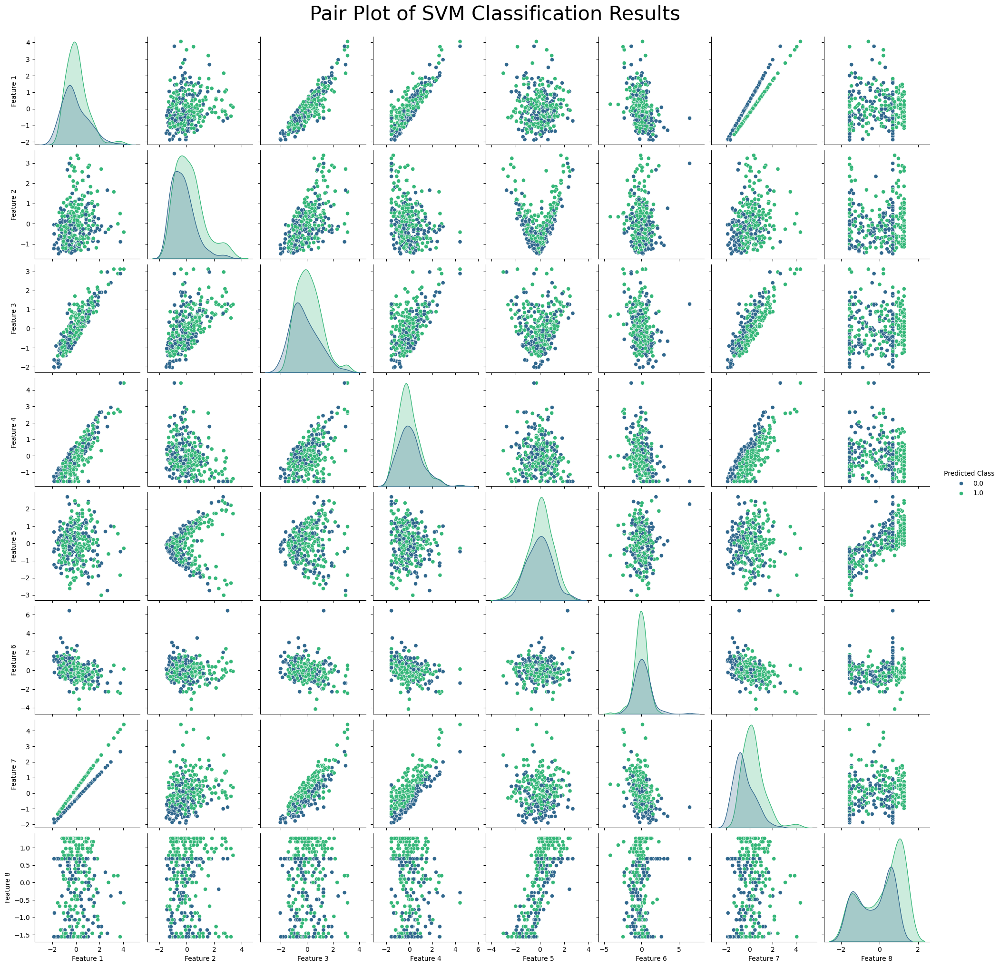

In [192]:
df = pd.DataFrame(X_test_scaled, columns=[f'Feature {i+1}' for i in range(X_test_scaled.shape[1])])
df['Predicted Class'] = svm_model.predict(X_test_scaled)

# Plot pairwise relationships
sns.pairplot(df, hue='Predicted Class', palette='viridis')
plt.suptitle('Pair Plot of SVM Classification Results', y=1.02, fontsize=30)
plt.show()


### Heatmaps of Confusion Matrix

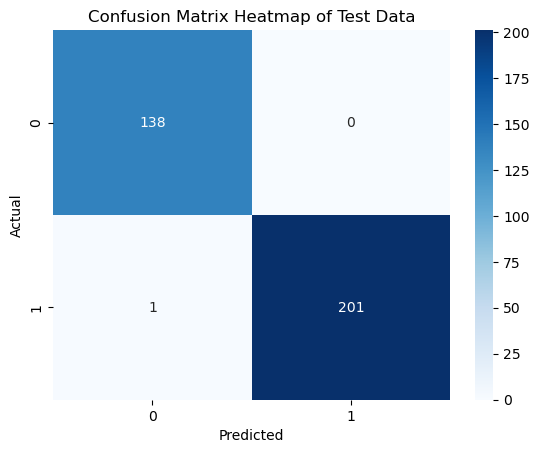

Accuracy: 0.9971
Recall: 0.9950
Precision: 1.0000
F1 Score: 0.9975


In [196]:
# Get the predicted classes
y_pred = svm_model.predict(X_test_scaled)

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the heatmap of the confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix Heatmap of Test Data')
plt.show()


# Print accuracy, recall, precision, and F1 score
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.4f}')
print(f'Recall: {recall:.4f}')
print(f'Precision: {precision:.4f}')
print(f'F1 Score: {f1:.4f}')

## Dump Model to Pickle File

In [184]:
with open('svm_model.pkl', 'wb') as f:
    pickle.dump(svm_model, f)